In [ ]:
folder = "VirtualValtteri"
# Although it turns out lap events was missing, had to fit lap breaks by hand. It's fairly easy to see where it repeats though.
filename = "vmkarting.2023-04-20-07-44-20.csv"

sensors = {
    'rotation': 'android.sensor.rotation_vector',
#    'acceleration': 'android.sensor.gyroscope',
#    'acceleration': 'android.sensor.linear_acceleration',
    'acceleration': 'Earth.Linear_Acceleration',
    'raceevent': 'RaceEvent',
}



In [ ]:
import pandas as pd
from google.colab import drive
import numpy as np

ROWS=0
COLS=1
drive.mount('/content/drive')
fullpath = '/content/drive/MyDrive/' + folder +"/"+ filename
names=['timestamp_index','type','sensortype_index','vendor','version','x','y','z','zz','quality','zz2','zz3','zz4','zz5','zz6','zz7','zz8','zz9','zz11','zz12','zz13','zz14']
dts={'timestamp_index':np.int64, 'type':int, 'sensortype':str, 'version':int, 'x':np.float64,'y':np.float64,'z':np.float64,'zz':np.float64}
alldata = pd.read_csv(fullpath,names=names, usecols=[0,2]+list(range(5,22)),dtype=dts,on_bad_lines='warn',sep=",",header=0,index_col=["timestamp_index","sensortype_index"])
# Doesn't work
#alldata.drop(['type','vendor','version'],axis='columns')

#alldata = alldata.drop(labels=names[11:],axis=COLS)
#alldata=alldata.head(-1)
alldata

Mounted at /content/drive


<ipython-input-2-a4fca131a1ac>:11: DtypeWarning: Columns (14,15) have mixed types. Specify dtype option on import or set low_memory=False.
  alldata = pd.read_csv(fullpath,names=names, usecols=[0,2]+list(range(5,22)),dtype=dts,on_bad_lines='warn',sep=",",header=0,index_col=["timestamp_index","sensortype_index"])


,,x,y,z,zz,quality,zz2,zz3,zz4,zz5,zz6,zz7,zz8,zz9,zz11,zz12,zz13,zz14
timestamp_index,sensortype_index,,,,,,,,,,,,,,,,,
381941413091641,Earth.Linear_Acceleration,-0.074733,0.025776,-0.084902,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
381941418080652,Earth.Linear_Acceleration,-0.050171,0.056246,-0.130119,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
381941413091641,android.sensor.rotation_vector,0.030978,-0.325534,-0.944113,0.041453,-1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
381941418080652,android.sensor.rotation_vector,0.031883,-0.326292,-0.943806,0.041803,-1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
381941423069662,Earth.Linear_Acceleration,-0.014098,0.069885,-0.143825,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
382277017080084,Earth.Linear_Acceleration,-0.051660,0.098353,-0.124437,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
382277022068677,Earth.Linear_Acceleration,-0.037975,0.156934,-0.207097,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
382277027057271,Earth.Linear_Acceleration,0.016151,0.213456,-0.279938,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
pd.options.display.width = 200
import math
alldata["timestamp"]=[i[0] for i in alldata.index.values]
alldata["sensortype"]=[i[1] for i in alldata.index.values]
#print(alldata.groupby(by=["timestamp","sensortype"]).count())

#alldata=alldata.sort_index()
alldata["counter"]=range(0,alldata["x"].size)
alldata["normindex"]=alldata["counter"]/alldata["x"].size

alldata["counter_index"]=alldata["counter"]
alldata.set_index(["counter_index"],append=True,inplace=True,verify_integrity=True)

def normcolor(normindex):
  c=1-normindex
  return (c,0,0)

alldata["timecolor"]=alldata["normindex"].apply(normcolor)


tmin=alldata.timestamp.to_numpy()[0]
print(tmin)
alldata["nanos"] = alldata["timestamp"]-tmin
nanos=[t-tmin for t in alldata.timestamp]
def minutesround(nanos):
    return round(nanos/1000.0/1000.0/1000.0/60.0,2)
alldata["minutes"]=alldata["nanos"].apply(minutesround)

alldata["zeros"]=[0.0]*alldata["minutes"].size

alldata["seconds"] = alldata["nanos"]/1000.0/1000.0/1000.0
# This is only meaningful within a given sensor!
#alldata["timedelta"] = alldata["seconds"].diff()

acceleration=alldata.loc[alldata['sensortype']==sensors['acceleration']]

rotation=alldata.loc[alldata['sensortype']==sensors['rotation']]

s = pd.concat([acceleration["seconds"].diff(),rotation["seconds"].diff()])
#alldata["timedelta"]=s


acceleration=alldata.loc[alldata['sensortype']==sensors['acceleration']]
rotation=alldata.loc[alldata['sensortype']==sensors['rotation']]

print(alldata.sensortype.unique())
print(alldata.size)
print(rotation.size)
print(acceleration.size)
print(alldata["timestamp"].max(),alldata["timestamp"].min())

print(acceleration)
print(rotation)
alldata

381941413091641
['Earth.Linear_Acceleration' 'android.sensor.rotation_vector' 'RaceEvent']
3382626
1674660
1707888
382277027057271 381941413091641
                                                                x         y         z   zz  quality  zz2  zz3  zz4  zz5  zz6  ... zz14        timestamp                 sensortype  counter  \
timestamp_index sensortype_index          counter_index                                                                       ...                                                             
381941413091641 Earth.Linear_Acceleration 0             -0.074733  0.025776 -0.084902  0.0      NaN  NaN  NaN  NaN  NaN  NaN  ...  NaN  381941413091641  Earth.Linear_Acceleration        0   
381941418080652 Earth.Linear_Acceleration 1             -0.050171  0.056246 -0.130119  0.0      NaN  NaN  NaN  NaN  NaN  NaN  ...  NaN  381941418080652  Earth.Linear_Acceleration        1   
381941423069662 Earth.Linear_Acceleration 4             -0.014098  0.069885 -0.143825  0.

,,,x,y,z,zz,quality,zz2,zz3,zz4,zz5,zz6,...,zz14,timestamp,sensortype,counter,normindex,timecolor,nanos,minutes,zeros,seconds
timestamp_index,sensortype_index,counter_index,,,,,,,,,,,,,,,,,,,,,
381941413091641,Earth.Linear_Acceleration,0,-0.074733,0.025776,-0.084902,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,381941413091641,Earth.Linear_Acceleration,0,0.000000,"(1.0, 0, 0)",0,0.00,0.0,0.000000
381941418080652,Earth.Linear_Acceleration,1,-0.050171,0.056246,-0.130119,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,381941418080652,Earth.Linear_Acceleration,1,0.000008,"(0.9999923136639995, 0, 0)",4989011,0.00,0.0,0.004989
381941413091641,android.sensor.rotation_vector,2,0.030978,-0.325534,-0.944113,0.041453,-1.0,NaN,NaN,NaN,NaN,NaN,...,NaN,381941413091641,android.sensor.rotation_vector,2,0.000015,"(0.999984627327999, 0, 0)",0,0.00,0.0,0.000000
381941418080652,android.sensor.rotation_vector,3,0.031883,-0.326292,-0.943806,0.041803,-1.0,NaN,NaN,NaN,NaN,NaN,...,NaN,381941418080652,android.sensor.rotation_vector,3,0.000023,"(0.9999769409919985, 0, 0)",4989011,0.00,0.0,0.004989
381941423069662,Earth.Linear_Acceleration,4,-0.014098,0.069885,-0.143825,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,381941423069662,Earth.Linear_Acceleration,4,0.000031,"(0.9999692546559981, 0, 0)",9978021,0.00,0.0,0.009978
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
382277017080084,Earth.Linear_Acceleration,130096,-0.051660,0.098353,-0.124437,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,382277017080084,Earth.Linear_Acceleration,130096,0.999962,"(3.843168000250419e-05, 0, 0)",335603988443,5.59,0.0,335.603988
382277022068677,Earth.Linear_Acceleration,130097,-0.037975,0.156934,-0.207097,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,382277022068677,Earth.Linear_Acceleration,130097,0.999969,"(3.0745344001936736e-05, 0, 0)",335608977036,5.59,0.0,335.608977
382277027057271,Earth.Linear_Acceleration,130098,0.016151,0.213456,-0.279938,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,382277027057271,Earth.Linear_Acceleration,130098,0.999977,"(2.3059008001480308e-05, 0, 0)",335613965630,5.59,0.0,335.613966


In [ ]:
od_interval_timestamps=[513284289775280+5000000000, rotation["timestamp"].to_numpy()[-1]-19000000000]
#good_interval_timestamps=[acceleration.iloc[0].timestamp, int((acceleration.iloc[-1].timestamp-acceleration.iloc[0].timestamp)/2+acceleration.iloc[0].timestamp)]
#good_interval_timestamps=[161624608584883, int((acceleration.iloc[-1].timestamp-acceleration.iloc[0].timestamp)/2+acceleration.iloc[0].timestamp)]
good_interval_timestamps=[acceleration.iloc[0].timestamp, int(acceleration.iloc[-1].timestamp)]

rotation2=rotation.loc[rotation["timestamp"]>=good_interval_timestamps[0]]
rotation2 = rotation2.loc[rotation2["timestamp"]<=good_interval_timestamps[1]]


acceleration2=acceleration.loc[acceleration["timestamp"]>=good_interval_timestamps[0]]
acceleration2 = acceleration2.loc[acceleration2["timestamp"]<=good_interval_timestamps[1]]

rotation2


,,,x,y,z,zz,quality,zz2,zz3,zz4,zz5,zz6,...,zz14,timestamp,sensortype,counter,normindex,timecolor,nanos,minutes,zeros,seconds
timestamp_index,sensortype_index,counter_index,,,,,,,,,,,,,,,,,,,,,
381941413091641,android.sensor.rotation_vector,2,0.030978,-0.325534,-0.944113,0.041453,-1.0,NaN,NaN,NaN,NaN,NaN,...,NaN,381941413091641,android.sensor.rotation_vector,2,0.000015,"(0.999984627327999, 0, 0)",0,0.00,0.0,0.000000
381941418080652,android.sensor.rotation_vector,3,0.031883,-0.326292,-0.943806,0.041803,-1.0,NaN,NaN,NaN,NaN,NaN,...,NaN,381941418080652,android.sensor.rotation_vector,3,0.000023,"(0.9999769409919985, 0, 0)",4989011,0.00,0.0,0.004989
381941423069662,android.sensor.rotation_vector,24,0.032320,-0.327091,-0.943504,0.042034,-1.0,NaN,NaN,NaN,NaN,NaN,...,NaN,381941423069662,android.sensor.rotation_vector,24,0.000184,"(0.9998155279359882, 0, 0)",9978021,0.00,0.0,0.009978
381941428058673,android.sensor.rotation_vector,25,0.032296,-0.327927,-0.943210,0.042153,-1.0,NaN,NaN,NaN,NaN,NaN,...,NaN,381941428058673,android.sensor.rotation_vector,25,0.000192,"(0.9998078415999877, 0, 0)",14967032,0.00,0.0,0.014967
381941433047683,android.sensor.rotation_vector,26,0.032151,-0.328922,-0.942863,0.042272,-1.0,NaN,NaN,NaN,NaN,NaN,...,NaN,381941433047683,android.sensor.rotation_vector,26,0.000200,"(0.9998001552639872, 0, 0)",19956042,0.00,0.0,0.019956
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
382276997125709,android.sensor.rotation_vector,130091,0.265316,0.116081,0.354505,0.889077,-1.0,NaN,NaN,NaN,NaN,NaN,...,NaN,382276997125709,android.sensor.rotation_vector,130091,0.999923,"(7.686336000489735e-05, 0, 0)",335584034068,5.59,0.0,335.584034
382277002114302,android.sensor.rotation_vector,130094,0.265562,0.116164,0.354197,0.889116,-1.0,NaN,NaN,NaN,NaN,NaN,...,NaN,382277002114302,android.sensor.rotation_vector,130094,0.999946,"(5.3804352003417044e-05, 0, 0)",335589022661,5.59,0.0,335.589023
382277007102896,android.sensor.rotation_vector,130095,0.265841,0.116314,0.354117,0.889045,-1.0,NaN,NaN,NaN,NaN,NaN,...,NaN,382277007102896,android.sensor.rotation_vector,130095,0.999954,"(4.6118016002960616e-05, 0, 0)",335594011255,5.59,0.0,335.594011


In [ ]:
userot=rotation2
useacc=acceleration2

In [ ]:
#/*quaternation to euler in XYZ (seq:123)*/
#https://stackoverflow.com/questions/30279065/how-to-get-the-euler-angles-from-the-rotation-vector-sensor-type-rotation-vecto

import math
def quat2eulerxyz(q):
  sin_theta = 2.0 * (q[1]*q[3] + q[0]*q[2])
  if abs(sin_theta)>1:
    print("Error in sensor data, sin(theta) = {} >1. Rounding down to 1.".format(2.0 * (q[1]*q[3] + q[0]*q[2])))
    sin_theta=sin_theta/abs(sin_theta)
  #/*euler-angles*/
  psi = math.atan2( -2.0 * (q[2]*q[3] - q[0]*q[1]) , q[0]*q[0] - q[1]*q[1]- q[2]*q[2] + q[3]*q[3] )
  theta = math.asin( sin_theta )
  phi = math.atan2( 2.0 * (-q[1]*q[2] + q[0]*q[3]) , q[0]*q[0] + q[1]*q[1] - q[2]*q[2] - q[3]*q[3] )
  e=[q[0]]*4
  e[1] = psi
  e[2] = theta
  e[3] = phi
  return e


import math
def quat2euler(q1,q2,q3,q0=None):
  e = quat2eulerxyz([q0,q1,q2,q3])
  return e[1]


In [ ]:
rot=userot.to_numpy()
qseries=[]
for r in rot:
#  print(r)
  q1 = r[0]
  q2 = r[1]
  q3 = r[2]
  q0 = r[3]
  if len(qseries) % (len(rot)/100)==0:
    # print (str(q0)  +"    vs    "+ str(math.sqrt(1-q1*q1-q2*q2-q3*q3)))
    pass

  qseries.append([q0,q1,q2,q3])



userot["eu_x"]=[q[1] for q in qseries]
userot["eu_y"]=[q[2] for q in qseries]
userot["eu_z"]=[q[3] for q in qseries]
userot["eu_zz"]=[q[0] for q in qseries]


angles=[]
rotx=[]
roty=[]
rotz=[]

for q in qseries:
  e = quat2eulerxyz(q)
  angles.append(e)
  rotx.append(e[1])
  roty.append(e[2])
  rotz.append(e[3])

rotzcorr=[(r -0/180*math.pi +math.pi) % (2*math.pi) - math.pi for r in rotz]
#rotzcorr=[r for r in rotz]
userot["eu_zcorr"]=rotzcorr
print(alldata)
print(userot)
print(qseries[0:5])
alldata

                                                                     x         y         z        zz  quality  zz2  zz3  zz4  zz5  zz6  ... zz14        timestamp                      sensortype  \
timestamp_index sensortype_index               counter_index                                                                            ...                                                         
381941413091641 Earth.Linear_Acceleration      0             -0.074733  0.025776 -0.084902  0.000000      NaN  NaN  NaN  NaN  NaN  NaN  ...  NaN  381941413091641       Earth.Linear_Acceleration   
381941418080652 Earth.Linear_Acceleration      1             -0.050171  0.056246 -0.130119  0.000000      NaN  NaN  NaN  NaN  NaN  NaN  ...  NaN  381941418080652       Earth.Linear_Acceleration   
381941413091641 android.sensor.rotation_vector 2              0.030978 -0.325534 -0.944113  0.041453     -1.0  NaN  NaN  NaN  NaN  NaN  ...  NaN  381941413091641  android.sensor.rotation_vector   
381941418080652

,,,x,y,z,zz,quality,zz2,zz3,zz4,zz5,zz6,...,zz14,timestamp,sensortype,counter,normindex,timecolor,nanos,minutes,zeros,seconds
timestamp_index,sensortype_index,counter_index,,,,,,,,,,,,,,,,,,,,,
381941413091641,Earth.Linear_Acceleration,0,-0.074733,0.025776,-0.084902,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,381941413091641,Earth.Linear_Acceleration,0,0.000000,"(1.0, 0, 0)",0,0.00,0.0,0.000000
381941418080652,Earth.Linear_Acceleration,1,-0.050171,0.056246,-0.130119,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,381941418080652,Earth.Linear_Acceleration,1,0.000008,"(0.9999923136639995, 0, 0)",4989011,0.00,0.0,0.004989
381941413091641,android.sensor.rotation_vector,2,0.030978,-0.325534,-0.944113,0.041453,-1.0,NaN,NaN,NaN,NaN,NaN,...,NaN,381941413091641,android.sensor.rotation_vector,2,0.000015,"(0.999984627327999, 0, 0)",0,0.00,0.0,0.000000
381941418080652,android.sensor.rotation_vector,3,0.031883,-0.326292,-0.943806,0.041803,-1.0,NaN,NaN,NaN,NaN,NaN,...,NaN,381941418080652,android.sensor.rotation_vector,3,0.000023,"(0.9999769409919985, 0, 0)",4989011,0.00,0.0,0.004989
381941423069662,Earth.Linear_Acceleration,4,-0.014098,0.069885,-0.143825,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,381941423069662,Earth.Linear_Acceleration,4,0.000031,"(0.9999692546559981, 0, 0)",9978021,0.00,0.0,0.009978
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
382277017080084,Earth.Linear_Acceleration,130096,-0.051660,0.098353,-0.124437,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,382277017080084,Earth.Linear_Acceleration,130096,0.999962,"(3.843168000250419e-05, 0, 0)",335603988443,5.59,0.0,335.603988
382277022068677,Earth.Linear_Acceleration,130097,-0.037975,0.156934,-0.207097,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,382277022068677,Earth.Linear_Acceleration,130097,0.999969,"(3.0745344001936736e-05, 0, 0)",335608977036,5.59,0.0,335.608977
382277027057271,Earth.Linear_Acceleration,130098,0.016151,0.213456,-0.279938,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,382277027057271,Earth.Linear_Acceleration,130098,0.999977,"(2.3059008001480308e-05, 0, 0)",335613965630,5.59,0.0,335.613966


<ipython-input-8-f784701e4d57>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  diff_pd["sec_diff"]=pd["seconds"].diff()


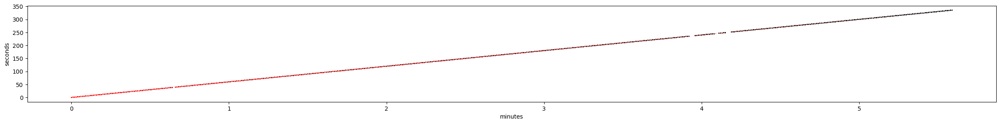

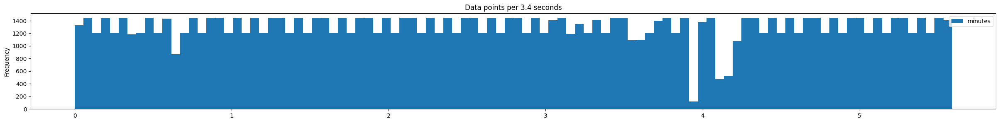

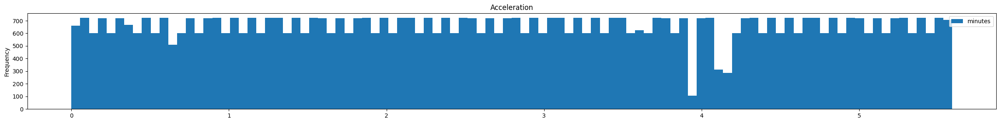

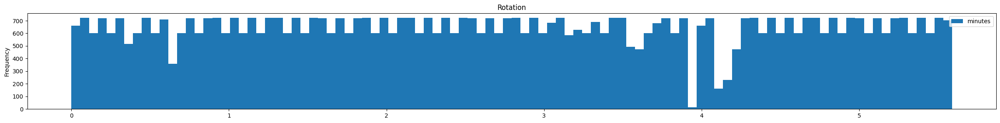

In [ ]:
alldata.plot(kind="scatter", x="minutes", y="seconds", figsize=(30,3),s=0.1,c=alldata["timecolor"].values)
max_sec=alldata["seconds"].max()
title="Data points per {} seconds".format(round(max_sec/100,1))

alldata.plot(kind="hist", y="minutes", figsize=(30,3),bins=100, title=title)

useacc.plot(kind="hist", y="minutes", figsize=(30,3),bins=100, title="Acceleration")

userot.plot(kind="hist", y="minutes", figsize=(30,3),bins=100, title="Rotation")

def check_gaps(pd,counter_column="counter"):
  #print(pd[counter_column])
  diff_pd = pd[[counter_column,"seconds","sensortype"]]
  #print(diff_pd)
  diff_pd["sec_diff"]=pd["seconds"].diff()
  #  c=diff_pd.query("sec_diff>0.1")
  #print(c)
  #print(c[counter_column].values)
  return
  return c[counter_column].values

metrics_gaps=check_gaps(alldata)
metrics_gaps

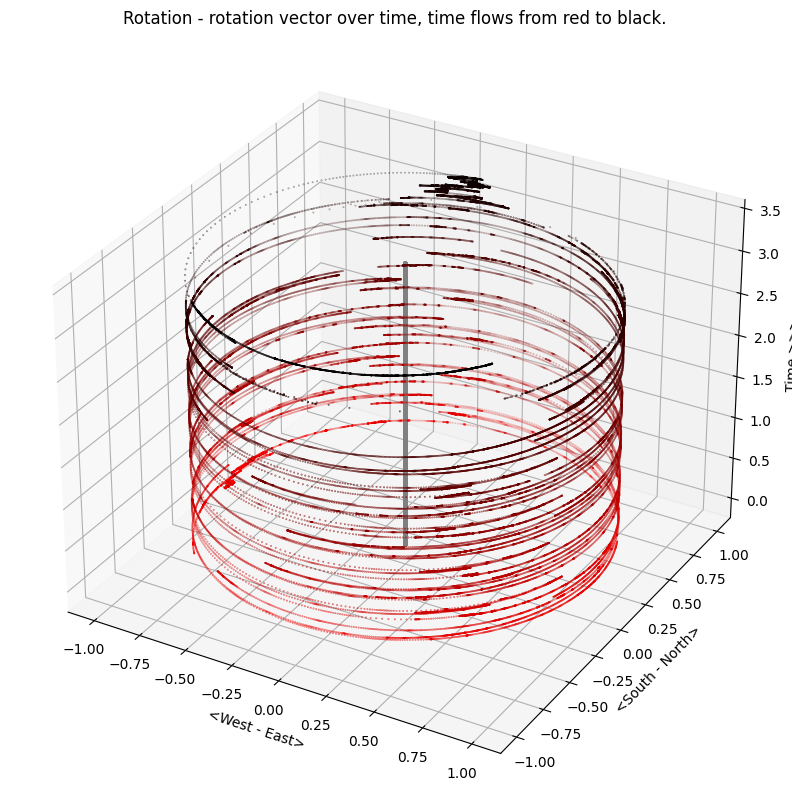

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import math
import random

# For some reason the angles are still reversed. I vaguely remember it's a gaming thing.
# Rotation of phone as viewport vs object in view
userot["x_around_z"] = userot["eu_zcorr"].apply(lambda x: -x).apply(math.cos)
userot["y_around_z"] = userot["eu_zcorr"].apply(lambda x: -x).apply(math.sin)
alldata["x_around_z"] = userot["eu_zcorr"].apply(lambda x: -x).apply(math.cos)
alldata["y_around_z"] = userot["eu_zcorr"].apply(lambda x: -x).apply(math.sin)

fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(projection='3d')
plt.title("Rotation - rotation vector over time, time flows from red to black.")

#print(userot)
foo=ax.scatter(userot['x_around_z'],userot['y_around_z'],userot["nanos"], color=userot["timecolor"], s=0.1)

ax.scatter(userot['zeros'],userot['zeros'], userot["nanos"], marker='.', color='gray', alpha=0.1)
#circlex=[math.cos(x) for x in range(0,360)]
#circley=[math.sin(y) for y in range(0,360)]
#circlez=userot["nanos"].sample(50)
#for i in circlez:
#  ax.scatter(circlex, circley, i, marker='.', s=0.3, color='purple', alpha=0.3)


ax.set_xlabel('<West - East>')
ax.set_ylabel('<South - North>')
ax.set_zlabel('Time >>>')


plt.show()


In [ ]:
print(alldata.query("sensortype=='RaceEvent'"))
print(alldata.query("zz9=='henrik i.'"))
#lapts = [0.005, 0.75, 1.4, 2.0,2.5,3.0,3.4]
laptimes=[58,48,50,46]
#lapts = [0.1, 63.0/60.0, (63.0+47.0)/60.0, (63.0+47.0+47.0)/60.0,(63.0+47.0+47.0+47.0)/60.0,(63.0+47.0+47.0+47.0+47)/60.0,3.4]
lapts=[]
s=0
for t in laptimes:
  s+=t
  lapts.append(s/60)
lapts.append(alldata['minutes'].max())
laps = []
for t in lapts:
  #print( alldata.query("minutes<="+str(t)).tail(1))
  i = alldata.query("minutes<="+str(t)).tail(1)["counter"].values[0]
  laps.append(i)
print(laps, lapts)

lap = [0]
i=0
lapstart=0
for lapend in laps:
    lap += [i]*(lapend-lapstart)
    lapstart=lapend
    i+=1

alldata["lap"]=lap
print(len(lap))
print(laps)
print(alldata.columns)
#print(alldata.query("counter>2520")[["counter","lap","lapcolor","minutes"]].head(10))

                                                  x    y    z   zz  quality  zz2  zz3  zz4  zz5     zz6  ... sensortype  counter  normindex                    timecolor         nanos  minutes  \
timestamp_index sensortype_index counter_index                                                           ...                                                                                      
381941761097356 RaceEvent        138            0.0  0.0  0.0  0.0      0.0  0.0  0.0  0.0  0.0    init  ...  RaceEvent      138   0.001061   (0.9989392856319321, 0, 0)     348005715     0.01   
381951139272457 RaceEvent        3899           0.0  0.0  0.0  0.0      0.0  0.0  0.0  0.0  0.0    init  ...  RaceEvent     3899   0.029969   (0.9700309759340819, 0, 0)    9726180816     0.16   
382145681578264 RaceEvent        80866          0.0  0.0  0.0  0.0      0.0  0.0  0.0  0.0  0.0  finish  ...  RaceEvent    80866   0.621563  (0.37843675298421997, 0, 0)  204268486623     3.40   

                        

In [ ]:
def acc2rot_z(xs,ys,zs):
  acc_xyangles=[]
  for i in range(1,len(xs)):
    angle=-math.atan2(ys[i],xs[i])
    acc_xyangles.append(angle)
  return acc_xyangles


<Axes: title={'center': 'Acceleration (raw)'}, xlabel='timestamp_index,sensortype_index,counter_index'>

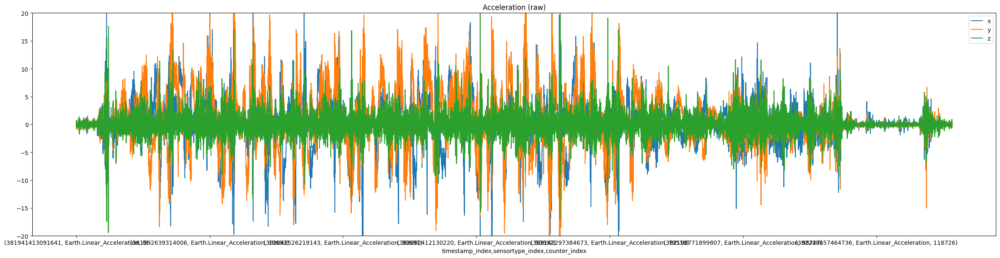

In [ ]:
useacc[["x","y","z"]].plot(figsize=(30,7),title="Acceleration (raw)", ylim=(-20,+20))

window size
155
                                                                x         y         z   zz  quality  zz2  zz3  zz4  zz5  zz6  ... counter  normindex                       timecolor         nanos  \
timestamp_index sensortype_index          counter_index                                                                       ...                                                                    
381942181400808 Earth.Linear_Acceleration 309           -0.226154 -0.323110  0.370328  0.0      NaN  NaN  NaN  NaN  NaN  NaN  ...     309   0.002375       (0.997624922175848, 0, 0)     768309167   
381942186389818 Earth.Linear_Acceleration 310           -0.168790 -0.358348  0.382434  0.0      NaN  NaN  NaN  NaN  NaN  NaN  ...     310   0.002383      (0.9976172358398475, 0, 0)     773298177   
381942191378829 Earth.Linear_Acceleration 313           -0.081272 -0.357445  0.363426  0.0      NaN  NaN  NaN  NaN  NaN  NaN  ...     313   0.002406       (0.997594176831846, 0, 0)     7782871

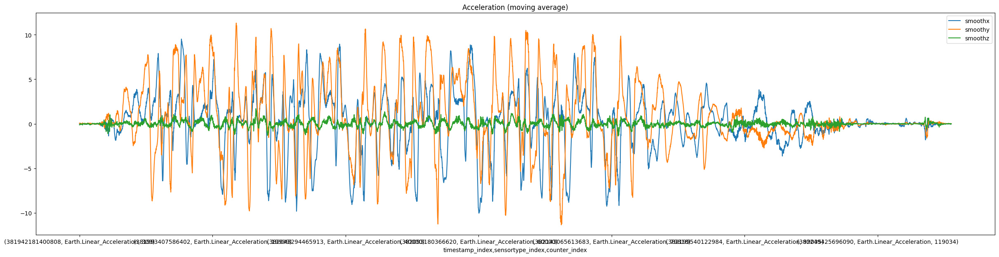

In [ ]:
a=useacc

mx = alldata.timestamp.max()
mi = alldata.timestamp.min()
num = alldata.timestamp.size
points_in_400ms = int(num/((mx-mi)/1000.0/1000.0/400.0))
points_in_200ms = int(num/((mx-mi)/1000.0/1000.0/200.0))
points_in_100ms = int(num/((mx-mi)/1000.0/1000.0/100.0))
points_in_10ms = int(num/((mx-mi)/1000.0/1000.0/10.0))
points_in_1ms = int(num/((mx-mi)/1000.0/1000.0))
points_in_1s = int(num/((mx-mi)/1000.0/1000.0/1000.0))
window_size=points_in_200ms
window_size=points_in_400ms
#window_size=points_in_1s
#window_size=max(points_in_1ms,2)
print("window size")
print(window_size)
#print(useacc)


useacc["smoothx"]=a["x"].rolling(window_size).mean()
useacc["smoothy"]=a["y"].rolling(window_size).mean()
useacc["smoothz"]=a["z"].rolling(window_size).mean()
alldata["smoothx"]=a["x"].rolling(window_size).mean()
alldata["smoothy"]=a["y"].rolling(window_size).mean()
alldata["smoothz"]=a["z"].rolling(window_size).mean()

useacc=useacc.dropna(subset=["smoothx","smoothy","smoothz"],how="all")

useacc[["smoothx","smoothy","smoothz"]].plot(figsize=(30,7),title="Acceleration (moving average)")
print(useacc)
print(useacc.columns)

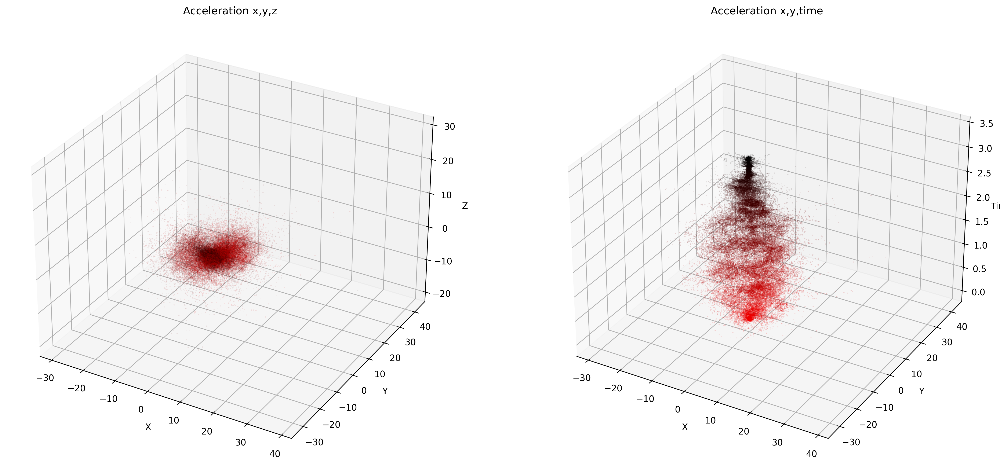

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import math
import random

fig = plt.figure(figsize=(20,40),dpi=300)

#xs=useacc["smoothx"].values
#ys=useacc["smoothy"].values
#zs=useacc["smoothz"].values
xs=useacc["x"].values
ys=useacc["y"].values
zs=useacc["z"].values
colors=useacc["timecolor"].values
ztime=useacc["nanos"].values
pole=[p for p in range(useacc["nanos"].values[0],useacc["nanos"].values[-1],int((useacc["nanos"].values[-1]-useacc["nanos"].values[0])/100))]


axs=[]
for i in range(0,2):
  ax = fig.add_subplot(1, 2, i+1, projection='3d')
  #ax.set_xlim(-3,3)
  #ax.set_ylim(-3,3)
  axs.append(ax)


axs[0].scatter(xs,ys,zs, alpha=0.2, c=colors, marker='.', s=0.1)
axs[1].scatter(xs,ys,ztime, alpha=0.3, c=colors, marker='.', s=0.1)



axs[0].set_title("Acceleration x,y,z")
axs[0].set_xlabel('X')
axs[0].set_ylabel('Y')
axs[0].set_zlabel('Z')
axs[1].set_title("Acceleration x,y,time")
axs[1].set_xlabel('X')
axs[1].set_ylabel('Y')
axs[1].set_zlabel('Time')

plt.show()
# Note that time doesn't actually start from zero because it takes like 5 secondse before both sensors are available.
# Also we might arbitrarily skip "garbage" from the beginning, like walking to the car or warmup lap


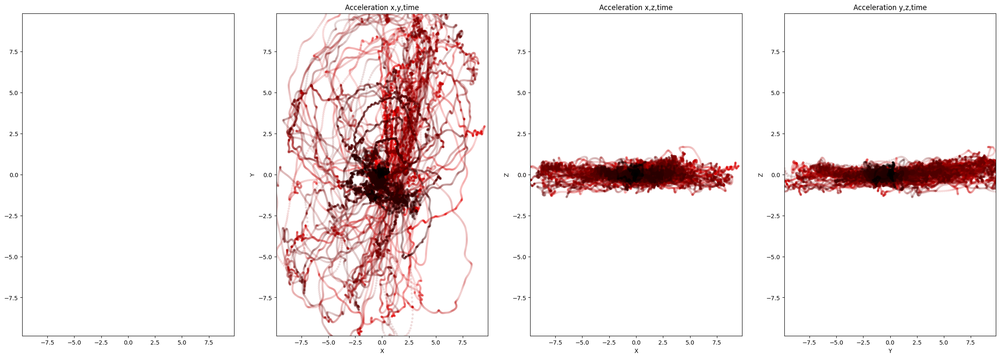

In [ ]:
xs=useacc["smoothx"].values
ys=useacc["smoothy"].values
zs=useacc["smoothz"].values
#xs=useacc["x"].values
#ys=useacc["y"].values
#zs=useacc["z"].values

colors=useacc["timecolor"].values
ztime=useacc["nanos"].values
pole=ztime
zeros=[0]*len(xs)
circlex=[3*math.cos(x) for x in range(0,360)]
circley=[3*math.sin(y) for y in range(0,360)]

spanx=useacc["smoothx"].abs().quantile(0.99)
spany=useacc["smoothy"].abs().quantile(0.99)
spanz=useacc["smoothz"].abs().quantile(0.99)
span=max(spanx,spany,spanz)

import matplotlib.pyplot as plt
import numpy as np
import math
import random

fig = plt.figure(figsize=(30,10))

axs=[]
for i in range(0,4):
  ax = fig.add_subplot(1, 4, i+1)
  ax.set_xlim(-span,span)
  ax.set_ylim(-span,span)
  axs.append(ax)

axs[1].scatter(xs,ys, alpha=0.1, color=colors, marker='.')
axs[2].scatter(xs,zs, alpha=0.1, color=colors, marker='.')
axs[3].scatter(ys,zs, alpha=0.1, color=colors, marker='.')

axs[1].set_title("Acceleration x,y,time")
axs[1].set_xlabel('X')
axs[1].set_ylabel('Y')
axs[2].set_title("Acceleration x,z,time")
axs[2].set_xlabel('X')
axs[2].set_ylabel('Z')
axs[3].set_title("Acceleration y,z,time")
axs[3].set_xlabel('Y')
axs[3].set_ylabel('Z')

plt.show()

In [ ]:
import math
def rotate_x(yzangle,x,y,z):
  xaxis=[x,
         y*math.cos(yzangle) - z * math.sin(yzangle),
         y*math.sin(yzangle) + z * math.cos(yzangle)]
  return xaxis

def rotate_y(xzangle,x,y,z):
  yaxis=[x * math.cos(xzangle) + z * math.sin(xzangle),
         y,
         -x * math.sin(xzangle) + z * math.cos(xzangle)]
  return yaxis

def rotate_xy(yzangle,xzangle,x,y,z):
  x,y,z = rotate_x(yzangle,x,y,z)
  x,y,z = rotate_y(xzangle,x,y,z)
  return x,y,z

def rotate_z(xyangle,x,y,z):
  zaxis=[x * math.cos(xyangle) - y * math.sin(xyangle),
         x * math.cos(xyangle) + y * math.cos(xyangle),
         z]
  return zaxis;

[array([0.97]), array([1.77]), array([2.61]), array([3.37])] [array([1.]), array([1.]), array([1.]), array([1.])]
[-2328.9043516708844, -1825.5263022343095, -913.747476258218, -675.4300324663155, 78.54654241248554]
1
2
3
4


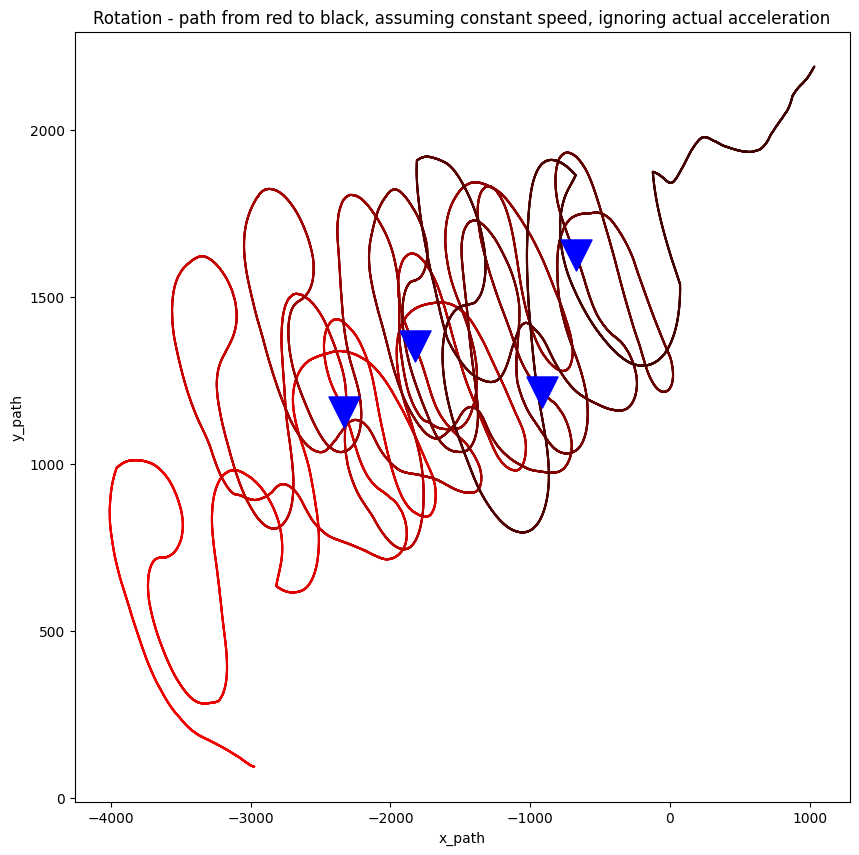

In [ ]:
from statistics import mean

userot["x_path"]=userot["x_around_z"].cumsum()
userot["y_path"]=userot["y_around_z"].cumsum()


from statistics import mean
lapmark=[]
lapendtime=[]
lapn=[]
i=0
minutes=alldata.query("sensortype == 'android.sensor.rotation_vector'")[["minutes"]].values
for m in alldata.query("sensortype == 'android.sensor.rotation_vector'")[["lap"]].diff().values:
  if m > 0:
    lapmark.append(m)
    lapendtime.append(minutes[i])
    lapn.append(i)
  i+=1

#[m if m>0 else None for m in alldata.query("sensortype == 'android.sensor.rotation_vector'")["lap"].diff().values]
print(lapendtime,lapmark)

# Make each lap start from the origin but don't force the end anywhere
x_lapstart=[userot["x_path"].iloc[n] for n in lapn]+[userot["x_path"].values[-1]]
y_lapstart=[userot["y_path"].iloc[n] for n in lapn]+[userot["y_path"].values[-1]]

lap = 0
x_path_origin=[]
y_path_origin=[]
print(x_lapstart)
for i in range(0,userot["x_path"].size):
  x_path_origin.append(userot["x_path"].iloc[i]-x_lapstart[lap])
  y_path_origin.append(userot["y_path"].iloc[i]-y_lapstart[lap])
  if i in lapn:
    lap+=1
    if lap>len(x_lapstart):
      break
    print(lap)



ax = userot.iloc[3000:49000].plot(kind="scatter", x="x_path",y="y_path",c="timecolor",s=0.3,title="Rotation - path from red to black, assuming constant speed, ignoring actual acceleration",figsize=(10,10))

for n in lapn:
  ax.scatter(userot["x_path"].values[n], userot["y_path"].values[n],marker='v', label="lap", color='blue', s=500)



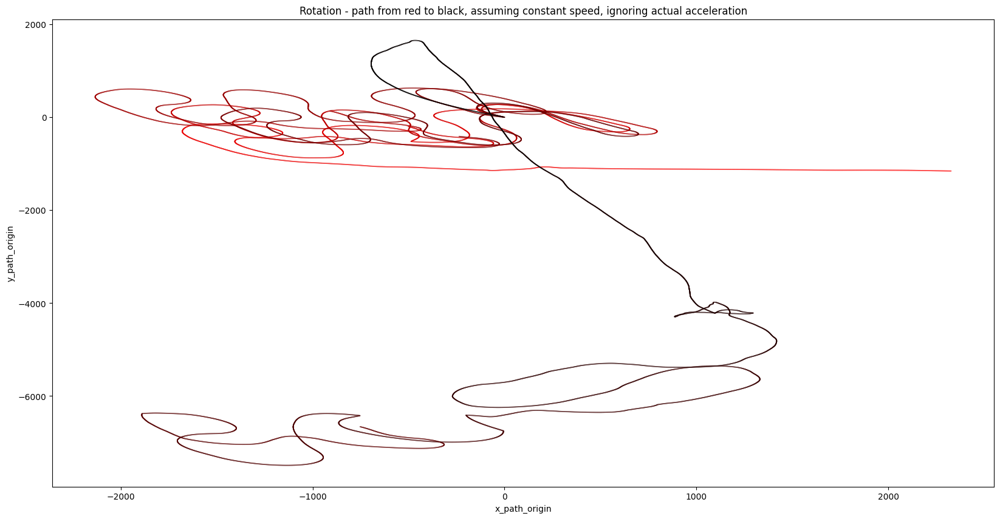

In [ ]:
userot["x_path_origin"]=x_path_origin
userot["y_path_origin"]=y_path_origin
alldata["x_path_origin"]=userot["x_path_origin"]
alldata["y_path_origin"]=userot["y_path_origin"]


lapcolors=['black','red','green','blue','magenta','orange','cyan','gray']*10
lapc = []
userot["lap"]=alldata.query("sensortype == 'android.sensor.rotation_vector'")["lap"]
#print(userot.head())
lapc=userot["lap"].apply(lambda x: lapcolors[x]).values
userot["lapcolor"]=lapc

ax = userot.plot(kind="scatter", x="x_path_origin",y="y_path_origin",c="timecolor",title="Rotation - path from red to black, assuming constant speed, ignoring actual acceleration",figsize=(20,10),s=0.1,alpha=0.3)
#fig = plt.figure(figsize=(14,7),dpi=100)
ax = fig.add_subplot(1,1,1)


#print(lapc[:100])
#print(x_path_origin[:100])
#print(y_path_origin[:100])
ax.scatter(x_path_origin,y_path_origin,color=lapc,s=0.2, alpha=0.5)
ax.grid()

for n in lapn:
  ax.scatter(userot["x_path_origin"].values[n-1], userot["y_path_origin"].values[n-1],marker='v', label="lap", color='blue', s=50, alpha=1.0)
plt.show()

In [ ]:
vmean=1
pmean=1
vdecay=1
pdecay=1

#VELOCITY
def acc2vel(xs,ys,zs,start=None):
  if start is None:
    start = [0,0,0]

  vxs=[x for x in xs]
  vys=[y for y in ys]
  vzs=[z for z in zs]
  vxs[0]=start[0]
  vys[0]=start[1]
  vzs[0]=start[2]
  for i in range(1,len(zs)):
    dt = (ts[i]-ts[i-1])*N2S
    if dt > 0.1:
      print(i,round(ts[i]*N2S,2),dt)
      dt=0
      #vxs[i]=0
      #vys[i]=0
      #vzs[i]=0
      #continue

    vxs[i]=vdecay*vxs[i-1]+vxs[i]*dt/2
    vys[i]=vdecay*vys[i-1]+vys[i]*dt/2
    vzs[i]=vdecay*vzs[i-1]+vzs[i]*dt/2

  xmean=mean(vxs)
  ymean=mean(vys)
  zmean=mean(vzs)
  vxs=[x-xmean*vmean for x in vxs]
  vys=[y-ymean*vmean for y in vys]
  vzs=[z-zmean*vmean for z in vzs]

  return vxs,vys,vzs



#POSITION
def vel2pos(vxs,vys,vzs,start=None):
  if start is None:
    start = [0,0,0]

  xxs=[x for x in vxs]
  yys=[x for x in vys]
  zzs=[x for x in vzs]
  xxs[0]=start[0]
  yys[0]=start[1]
  zzs[0]=start[2]
  for i in range(1,len(xxs)):
    dt = (ts[i]-ts[i-1])*N2S
    if dt > 0.1:
      print(i,round(ts[i]*N2S,2),dt)
      dt=0
      #vxs[i]=0
      #vys[i]=0
      #vzs[i]=0
      #continue

    xxs[i]=pdecay*xxs[i-1]+xxs[i]*dt/2
    yys[i]=pdecay*yys[i-1]+yys[i]*dt/2
    zzs[i]=pdecay*zzs[i-1]+zzs[i]*dt/2

  xmean=mean(xxs)
  ymean=mean(yys)
  zmean=mean(zzs)
  xxs=[x-xmean*pmean for x in xxs]
  yys=[y-ymean*pmean for y in yys]
  zzs=[z-zmean*pmean for z in zzs]

  return xxs,yys,zzs

#vxs,vys,vzs = acc2vel(xs,ys,zs,startv)
#xxs,yys,zzs = vel2pos(vxs,vys,vzs,startp)


4364 22.81 0.27938020799999996
7505 39.55 1.06759974
42918 216.7 0.4988489589999999
46581 237.45 2.4842581249999998
48115 246.55 1.4466551559999998
48659 251.44 2.1799547919999998
4364 22.81 0.27938020799999996
7505 39.55 1.06759974
42918 216.7 0.4988489589999999
46581 237.45 2.4842581249999998
48115 246.55 1.4466551559999998
48659 251.44 2.1799547919999998


<ipython-input-20-0b65e49d3502>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  useacc["vx"]=vxs
<ipython-input-20-0b65e49d3502>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  useacc["vy"]=vys
<ipython-input-20-0b65e49d3502>:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-vers

4364 22.81 0.27938020799999996
7505 39.55 1.06759974
42918 216.7 0.4988489589999999
46581 237.45 2.4842581249999998
48115 246.55 1.4466551559999998
48659 251.44 2.1799547919999998
4364 22.81 0.27938020799999996
7505 39.55 1.06759974
42918 216.7 0.4988489589999999
46581 237.45 2.4842581249999998
48115 246.55 1.4466551559999998
48659 251.44 2.1799547919999998


<ipython-input-20-0b65e49d3502>:84: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  useacc["vx"]=vxs
<ipython-input-20-0b65e49d3502>:85: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  useacc["vy"]=vys
<ipython-input-20-0b65e49d3502>:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-vers

                                                                x         y         z   zz  quality  zz2  zz3  zz4  zz5  zz6  ...     seconds   smoothx   smoothy   smoothz        vx        vy  \
timestamp_index sensortype_index          counter_index                                                                       ...                                                                 
381942181400808 Earth.Linear_Acceleration 309           -0.226154 -0.323110  0.370328  0.0      NaN  NaN  NaN  NaN  NaN  NaN  ...    0.768309 -0.018612  0.071420 -0.126249  0.000000  0.000000   
381942186389818 Earth.Linear_Acceleration 310           -0.168790 -0.358348  0.382434  0.0      NaN  NaN  NaN  NaN  NaN  NaN  ...    0.773298 -0.019219  0.068942 -0.123234 -0.000048  0.000172   
381942191378829 Earth.Linear_Acceleration 313           -0.081272 -0.357445  0.363426  0.0      NaN  NaN  NaN  NaN  NaN  NaN  ...    0.778287 -0.019419  0.066273 -0.120050 -0.000096  0.000337   
381942196367839 Earth.Lin

/usr/local/lib/python3.10/dist-packages/matplotlib/cbook/__init__.py:1062: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  x = np.asanyarray(x)


(38.59633990591368, 4.585179343319203, -11.790185343069801)
(63.32657047128357, 19.335150341558975, -14.906655692669581)
(1.5886883083860295, -0.04768930477667325, -1.427691800583785)


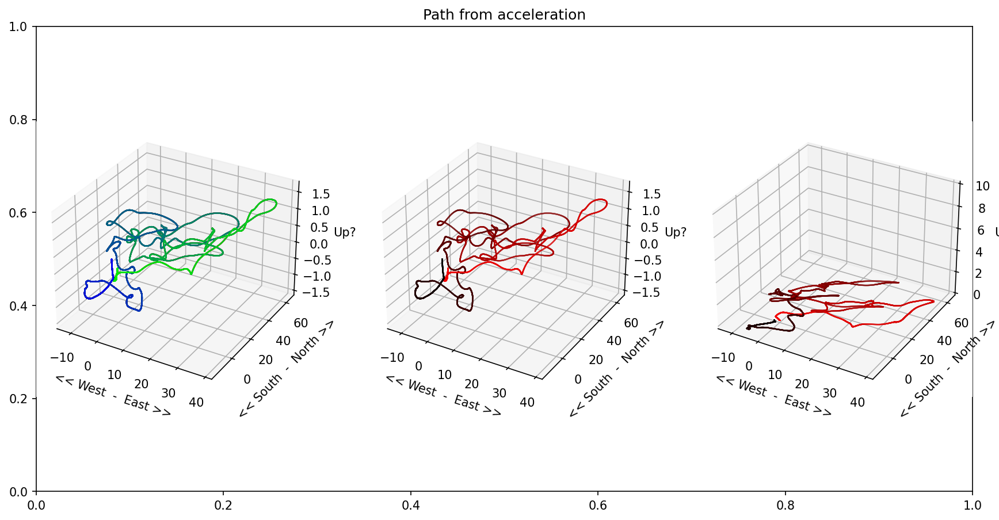

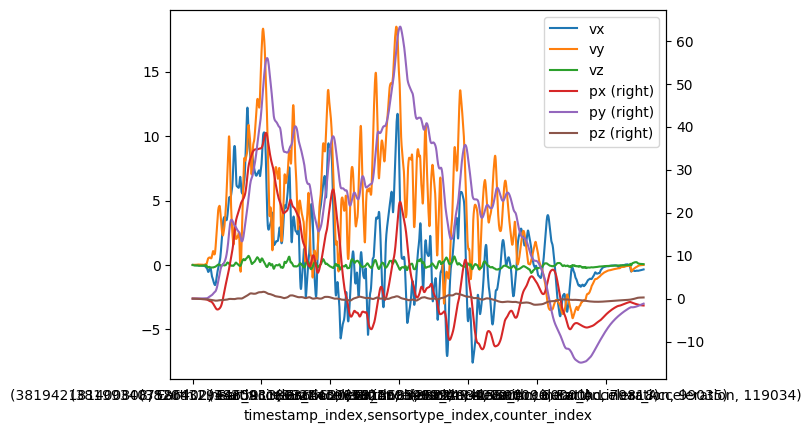

In [ ]:
N2S=1.0/1000.0/1000.0/1000.0
#N2S=1
reset_every=100000000
vdecay=0.9995
pdecay=0.9995
vmean=0
pmean=0
pd.options.display.width = 200



import time
import scipy

fig = plt.figure(figsize=(14,7),dpi=150)
plt.title("Path from acceleration")

ts=useacc["nanos"].values
xs=useacc["smoothx"].values
ys=useacc["smoothy"].values
zs=useacc["smoothz"].values
#xs=useacc["x"].values
#ys=useacc["y"].values
#zs=useacc["z"].values

ztime=useacc.query("abs(smoothx) >=0")["nanos"].values
pole=ztime

zeros=[0]*useacc["smoothx"].size
circlex=[3*math.cos(x) for x in range(0,360)]
circley=[3*math.sin(y) for y in range(0,360)]

vxs,vys,vzs = acc2vel(xs,ys,zs)
xxs,yys,zzs = vel2pos(vxs,vys,vzs)

useacc["vx"]=vxs
useacc["vy"]=vys
useacc["vz"]=vzs

useacc["px"]=xxs
useacc["py"]=yys
useacc["pz"]=zzs


useacc[["vx","vy","vz","px","py","pz"]].plot(secondary_y=["px","py","pz"])



zeros=[0.0]*len(xxs)
colors=['yellow']*len(xxs)
for i in range(0,len(colors)):
  colors[i]=((len(colors)-i)/len(colors),0,0)
  if i%reset_every==0:
    colors[i]='yellow'

ax = fig.add_subplot(1,3,1,projection='3d')

#step=int(len(colors)/10)
#print(len(colors),step)
#for n in laps[0:-2]:
#  for m in range(0,500):
#    k=n+m
#    colors[k]=(0,0,1)
colors2=[0]*len(colors)
for i in range(0,len(colors)):
  colors2[i]=(0,(len(colors)-i)/len(colors),i/len(colors))

ax.scatter(xxs, yys, zzs, marker='.', color=colors, alpha=0.3,s=0.1)
ax.scatter(useacc["px"].values, useacc["py"].values, useacc["pz"].values, marker='*',s=0.1, color=colors2[-useacc["px"].size:], alpha=0.1)


ax.set_xlabel('<< West  -  East >>')
ax.set_ylabel('<< South  -  North >>')
ax.set_zlabel('Up?')

#vdecay=0.99999
#pdecay=0.99999
#vmean=1
#pmean=1

vxs,vys,vzs = acc2vel(xs,ys,zs)
xxs,yys,zzs = vel2pos(vxs,vys,vzs)

useacc["vx"]=vxs
useacc["vy"]=vys
useacc["vz"]=vzs
useacc["px"]=xxs
useacc["py"]=yys
useacc["pz"]=zzs

alldata["vx"]=useacc["vx"]
alldata["vy"]=useacc["vy"]
alldata["vz"]=useacc["vz"]
alldata["px"]=useacc["px"]
alldata["py"]=useacc["py"]
alldata["pz"]=useacc["pz"]

print(useacc)
print(xxs[:20])

ax2 = fig.add_subplot(1,3,2,projection='3d')
ax2.scatter(xxs, yys, zzs, marker='.', color=colors, alpha=0.2, s=0.1)

ax2.set_xlabel('<< West  -  East >>')
ax2.set_ylabel('<< South  -  North >>')
ax2.set_zlabel('Up?')

ax = fig.add_subplot(1,3,3,projection='3d')
ax.scatter(xxs, yys, zeros, marker='.', color=colors, alpha=0.2,s=0.1)

ax.set_zlim(0,10)
ax.set_xlabel('<< West  -  East >>')
ax.set_ylabel('<< South  -  North >>')
ax.set_zlabel('Up?')

print((max(xxs),mean(xxs),min(xxs)))
print((max(yys),mean(yys),min(yys)))
print((max(zzs),mean(zzs),min(zzs)))

plt.show()



In [ ]:
def straighten_angles(angles):
  top=0
  angles2=[]
  aprev=angles[0]
  boundary=math.pi/2
  for a in angles:
    if a - aprev < -boundary+0.4:
        top += math.pi*2
    elif a - aprev > boundary-0.4:
        top -= math.pi*2
    elif a - aprev < -boundary+0.4:
        top -= math.pi*2
    elif a - aprev > boundary-0.4:
        top += math.pi*2
    aprev=a

    angles2.append((a + top))

  return angles2;


                                                                     x         y         z        zz  quality  zz2  zz3  zz4  zz5  zz6  ...   smoothz  x_path_origin  y_path_origin        vx  \
timestamp_index sensortype_index               counter_index                                                                            ...                                                     
381941413091641 Earth.Linear_Acceleration      0             -0.074733  0.025776 -0.084902  0.000000      NaN  NaN  NaN  NaN  NaN  NaN  ...       NaN            NaN            NaN       NaN   
381941418080652 Earth.Linear_Acceleration      1             -0.050171  0.056246 -0.130119  0.000000      NaN  NaN  NaN  NaN  NaN  NaN  ...       NaN            NaN            NaN       NaN   
381941413091641 android.sensor.rotation_vector 2              0.030978 -0.325534 -0.944113  0.041453     -1.0  NaN  NaN  NaN  NaN  NaN  ...       NaN    2327.906054   -1156.577039       NaN   
381941418080652 android.sensor.rota

<ipython-input-22-92b71b5e51d0>:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  useacc["short_counter"]=range(0,len(useacc['zz'].values))
<ipython-input-8-f784701e4d57>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  diff_pd["sec_diff"]=pd["seconds"].diff()
<ipython-input-8-f784701e4d57>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pa

Index(['x', 'y', 'z', 'zz', 'quality', 'zz2', 'zz3', 'zz4', 'zz5', 'zz6', 'zz7', 'zz8', 'zz9', 'zz11', 'zz12', 'zz13', 'zz14', 'timestamp', 'sensortype', 'counter', 'normindex', 'timecolor', 'nanos',
       'minutes', 'zeros', 'seconds', 'eu_x', 'eu_y', 'eu_z', 'eu_zz', 'eu_zcorr', 'x_around_z', 'y_around_z', 'x_path', 'y_path', 'x_path_origin', 'y_path_origin', 'lap', 'lapcolor',
       'eu_z_continuous', 'short_counter'],
      dtype='object')
[array([0.97]), array([1.77]), array([2.61]), array([3.37])] [array([1.]), array([1.]), array([1.]), array([1.])]
Index(['x', 'y', 'z', 'zz', 'quality', 'zz2', 'zz3', 'zz4', 'zz5', 'zz6', 'zz7', 'zz8', 'zz9', 'zz11', 'zz12', 'zz13', 'zz14', 'timestamp', 'sensortype', 'counter', 'normindex', 'timecolor', 'nanos',
       'minutes', 'zeros', 'seconds', 'eu_x', 'eu_y', 'eu_z', 'eu_zz', 'eu_zcorr', 'x_around_z', 'y_around_z', 'x_path', 'y_path', 'x_path_origin', 'y_path_origin', 'lap', 'lapcolor',
       'eu_z_continuous', 'short_counter'],
      dt

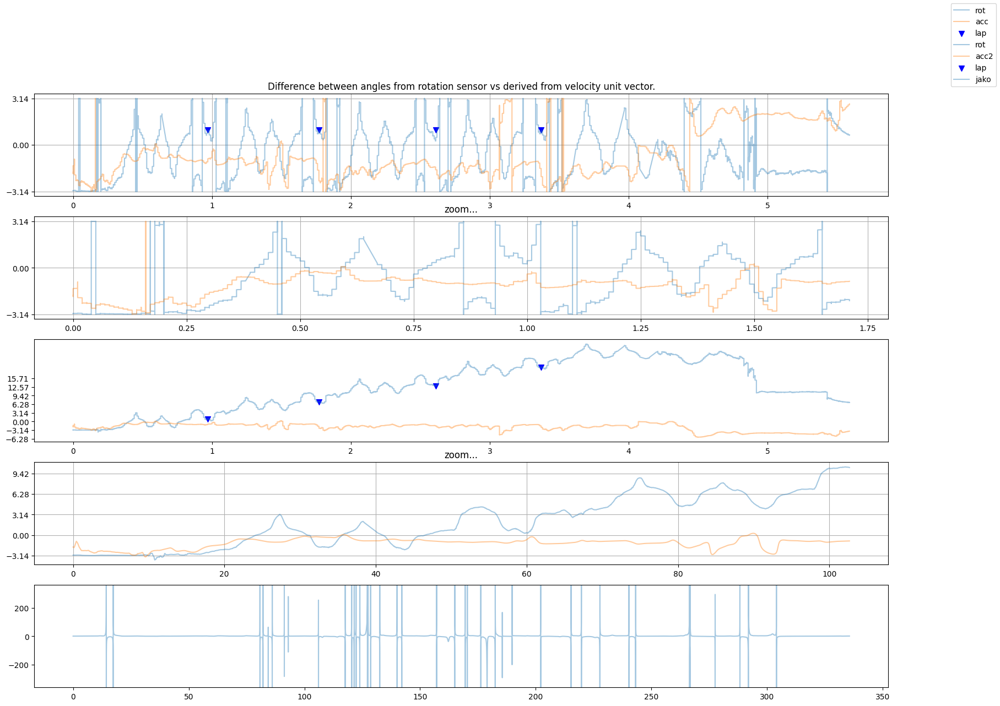

[]


In [ ]:
useaxis=rotzcorr

#useaxis=[z for z in useaxis]
useaxis2=[]
top=0
#boundary = math.pi
zprev=useaxis[0]
counter=0

useaxis2 = straighten_angles(useaxis)
useaxis2 = straighten_angles(useaxis2)
userot["eu_z_continuous"]=useaxis2
alldata["eu_z_continuous"]=userot["eu_z_continuous"]

#useaxis=useaxis2
diffangles=[]



print(alldata)


useacc["short_counter"]=range(0,len(useacc['zz'].values))
userot["short_counter"]=range(0,len(userot["z"].values))
metrics_gaps_rot=check_gaps(userot, "short_counter")
metrics_gaps_acc=check_gaps(useacc, "short_counter")

#print(len(userot["eu_x"].values),len(useacc['zz'].values),alldata["x"].size, userot["x"].size)

accangles=acc2rot_z(vxs,vys,vzs)
prod=[(y+1)/(x+1) for x,y in zip(vxs,vys)]


accangles2=straighten_angles(accangles)
#accangles2=straighten_angles(accangles2)
#accangles2=straighten_angles(accangles2)
useacc["acc_z_continuous"]=[accangles2[0]]+accangles2
alldata["acc_z_continuous"]=useacc["acc_z_continuous"]

diff=useaxis2[0]-accangles2[0]
useaxis_shift=[z - diff for z in useaxis2]

common_len=min(len(userot["minutes"].values),len(useaxis),len(accangles))

fig = plt.figure(figsize=(20,14))
ax = fig.add_subplot(5,1,1)
ax.set_yticks([-2*math.pi, -math.pi, 0, math.pi, 2*math.pi])
ax.set_title("Difference between angles from rotation sensor vs derived from velocity unit vector.")
o=ax.plot(userot["minutes"].values[:common_len],useaxis[:common_len], label="rot", alpha=0.4)
o=ax.plot(userot["minutes"].values[:common_len],accangles[:common_len], label="acc", alpha=0.4)
ax.grid()

#t=[useacc["minutes"].values[gap] for gap in metrics_gaps_acc]
#a=[accangles[a] for a in metrics_gaps_acc]
#ax.scatter(t, a ,marker='x', color='black', alpha=1, s=200)

print(userot.columns)
#t=[userot["minutes"].values[gap] for gap in metrics_gaps_rot]
#a=[userot["eu_zcorr"].values[a] for a in metrics_gaps_rot]
#ax.scatter(t, a ,marker='x', color='red', alpha=1, s=200)

lapmark=[]
lapendtime=[]
lapn=[]
i=0
minutes=alldata.query("sensortype == 'android.sensor.rotation_vector'")[["minutes"]].values
for m in alldata.query("sensortype == 'android.sensor.rotation_vector'")[["lap"]].diff().values:
  if m > 0:
    lapmark.append(m)
    lapendtime.append(minutes[i])
    lapn.append(i)
  i+=1

#[m if m>0 else None for m in alldata.query("sensortype == 'android.sensor.rotation_vector'")["lap"].diff().values]
print(lapendtime,lapmark)
ax.scatter(lapendtime, lapmark,marker='v', label="lap", color='blue', s=50)


#lapmarkx=[xxs[0]]+[x if m>0 else None for x,y,m in zip(xxs,yys,alldata.query("smoothx>-200000")["lap"].diff().values[:-1])]
#lapmarky=[yys[0]]+[y if m>0 else None for x,y,m in zip(xxs,yys,alldata.query("smoothx>-200000")["lap"].diff().values[:-1])]
#lapcolors=['black','red','green','blue',(1,0.9,0.9),'magenta','orange','cyan','gray']*10
# android.sensor.rotation_vector 	64410
# Earth.Linear_Acceleration  64410
#lapc = [lapcolors[n] for n in alldata.query("sensortype == 'android.sensor.rotation_vector'")["lap"].values]
#ax.scatter(xxs[0:len(lapc)], yys[0:len(lapc)], marker='*', color=lapc, alpha=0.2, s=2)

ax = fig.add_subplot(5,1,2)
ax.set_yticks([-5*math.pi, -4*math.pi, -3*math.pi, -2*math.pi, -math.pi, 0, math.pi, 2*math.pi, 3*math.pi, 4*math.pi, 5*math.pi])
ax.set_title("zoom...")
o=ax.plot(userot["minutes"].values[:20000],useaxis[:20000], alpha=0.4)
o=ax.plot(userot["minutes"].values[:20000],accangles[:20000], alpha=0.4)
ax.grid()


ax = fig.add_subplot(5,1,3)
ax.set_yticks([-5*math.pi, -4*math.pi, -3*math.pi, -2*math.pi, -math.pi, 0, math.pi, 2*math.pi, 3*math.pi, 4*math.pi, 5*math.pi])
o=ax.plot(userot["minutes"].values[:common_len],useaxis2[:common_len], label="rot", alpha=0.4)
o=ax.plot(userot["minutes"].values[:common_len],accangles2[:common_len], label="acc2", alpha=0.4)
#o=ax.plot(userot["minutes"].values[:common_len],useaxis_shift[:common_len], label="rot_shifted", alpha=0.4)
ax.scatter(lapendtime, [useaxis2[n] for n in lapn], marker='v', label="lap", color='blue', s=50)

#print(metrics_gaps_acc)
#print(metrics_gaps_rot)

#t=[useacc["seconds"].values[gap] for gap in metrics_gaps_acc]
#a=[accangles2[a] for a in metrics_gaps_acc]
#ax.scatter(t, a ,marker='x', color='black', alpha=1, s=200, label="Data missing acc")


print(userot.columns)
#t=[userot["seconds"].values[gap] for gap in metrics_gaps_rot]
#a=[userot["eu_zcorr"].values[a] for a in metrics_gaps_rot]
#ax.scatter(t, a ,marker='x', color='red', alpha=1, s=200, label="Data missing rot")
#ax.grid()


ax = fig.add_subplot(5,1,4)
ax.set_yticks([-5*math.pi, -4*math.pi, -3*math.pi, -2*math.pi, -math.pi, 0, math.pi, 2*math.pi, 3*math.pi, 4*math.pi, 5*math.pi])
ax.set_title("zoom...")
o=ax.plot(userot["seconds"].values[:20000],useaxis2[:20000], alpha=0.4)
o=ax.plot(userot["seconds"].values[:20000],accangles2[:20000], alpha=0.4)
#o=ax.plot(userot["minutes"].values[:20000],useaxis_shift[:20000], alpha=0.4)
ax.grid()



ax = fig.add_subplot(5,1,5)
ax.set_ylim(-360,360)
o=ax.plot(userot["seconds"].values[:common_len],prod[:common_len], label="jako", alpha=0.4)
o=fig.legend()
plt.show()




print(diffangles[0:20])



Index(['x', 'y', 'z', 'zz', 'quality', 'zz2', 'zz3', 'zz4', 'zz5', 'zz6', 'zz7', 'zz8', 'zz9', 'zz11', 'zz12', 'zz13', 'zz14', 'timestamp', 'sensortype', 'counter', 'normindex', 'timecolor', 'nanos',
       'minutes', 'zeros', 'seconds', 'eu_x', 'eu_y', 'eu_z', 'eu_zz', 'eu_zcorr', 'x_around_z', 'y_around_z', 'x_path', 'y_path', 'x_path_origin', 'y_path_origin', 'lap', 'lapcolor',
       'eu_z_continuous', 'short_counter', 'x_around_z_continuous', 'y_around_z_continuous'],
      dtype='object')


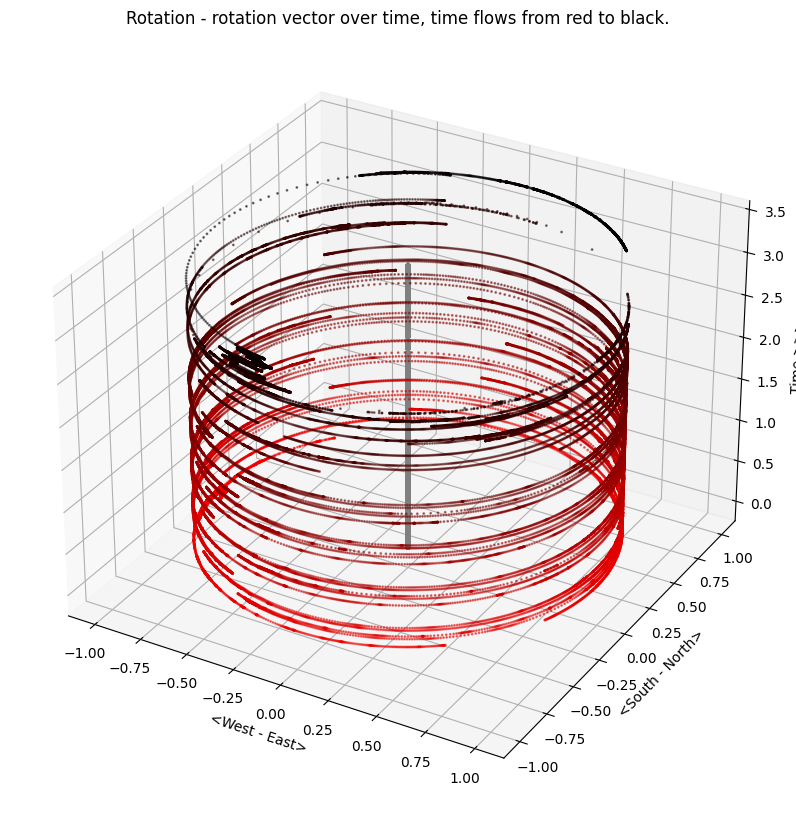

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import math
import random

# For some reason the angles are still reversed. I vaguely remember it's a gaming thing.
# Rotation of phone as viewport vs object in view
userot["x_around_z_continuous"] = userot["eu_z_continuous"].apply(math.cos)
userot["y_around_z_continuous"] = userot["eu_z_continuous"].apply(math.sin)
alldata["x_around_z_continuous"] = userot["x_around_z_continuous"]
alldata["y_around_z_continuous"] = userot["y_around_z_continuous"]
#userot["eu_z_continuous"]

fig = plt.figure(figsize=(10,20))
ax = fig.add_subplot(projection='3d')
plt.title("Rotation - rotation vector over time, time flows from red to black.")
print(userot.columns)
shift_laps=[9]

#print(userot)
foo=ax.scatter(userot['x_around_z_continuous'],userot['y_around_z_continuous'],userot["nanos"], color=userot["timecolor"], s=1,alpha=0.5)

ax.scatter(userot['zeros'],userot['zeros'], userot["nanos"], marker='.', color='gray', alpha=0.1)

ax.set_xlabel('<West - East>')
ax.set_ylabel('<South - North>')
ax.set_zlabel('Time >>>')

#ax.view_init(20, 10, 180)
#ax.set_xlim(ats[0],ats[20000])
#ax.set_zlim( 0,fbase)
#ax.set_ylim(-sbase,+sbase)
#ax.set_box_aspect((np.ptp(ats)*6, 2*np.ptp(ats), np.ptp(ats)))  # aspect ratio is 1:1:1 in data space
#fig.subplots_adjust(top=1, bottom=-1.0, left=-1, right=1)

plt.show()


[-0.99829815 -0.99829765 -0.998293   ...  0.70372774  0.70170868
  0.69949467]
[0.69703964 0.69439728 0.69172864 ... 0.72317218 0.72194044 0.72058163]
[0.71905239 0.71744825 0.71591725 ... 0.91847044 0.91870023 0.91895862]
[0.91924973 0.91955557 0.91984899 ... 0.70947101 0.70934275 0.70914933]
[0.70928806 0.70982474 0.71073908 ... 0.78610098 0.78673733 0.78706467]


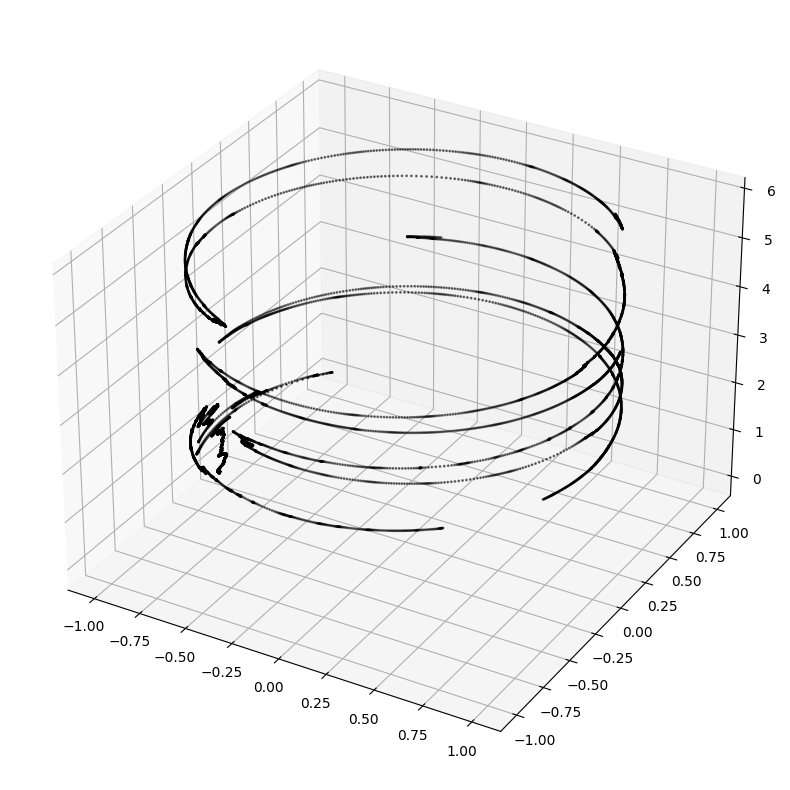

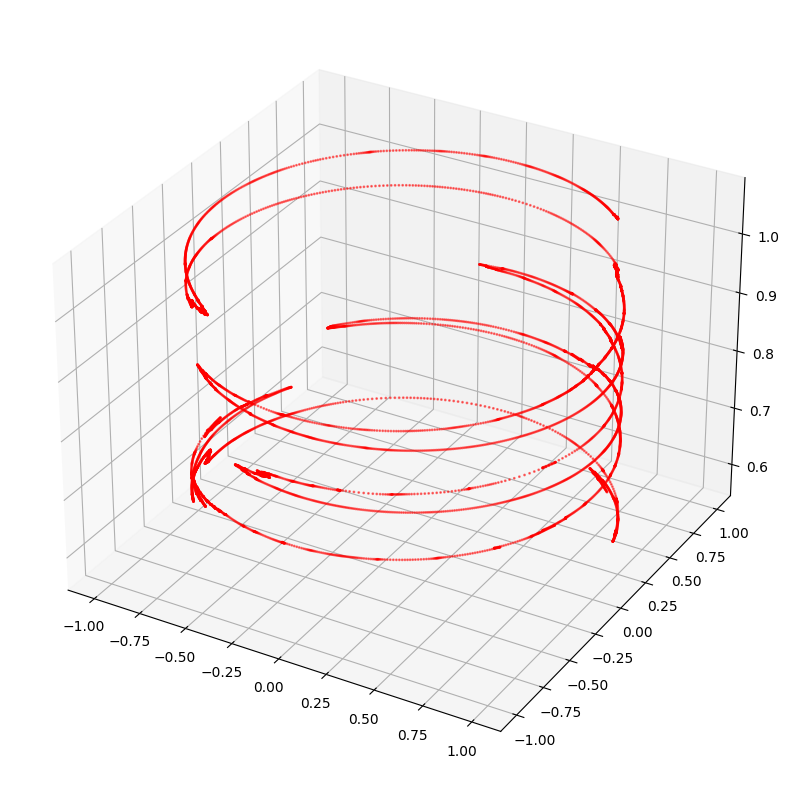

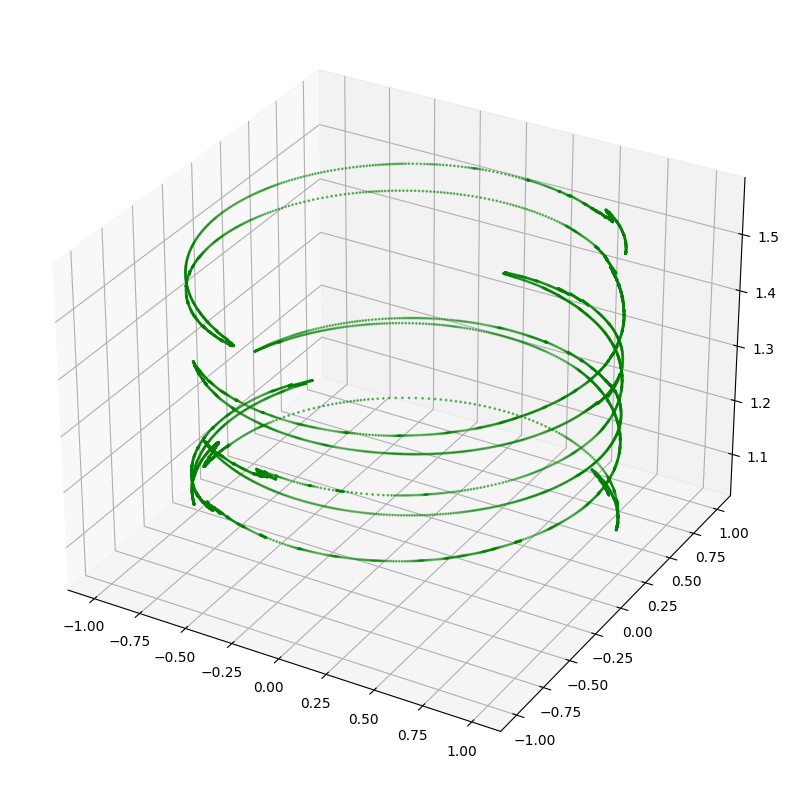

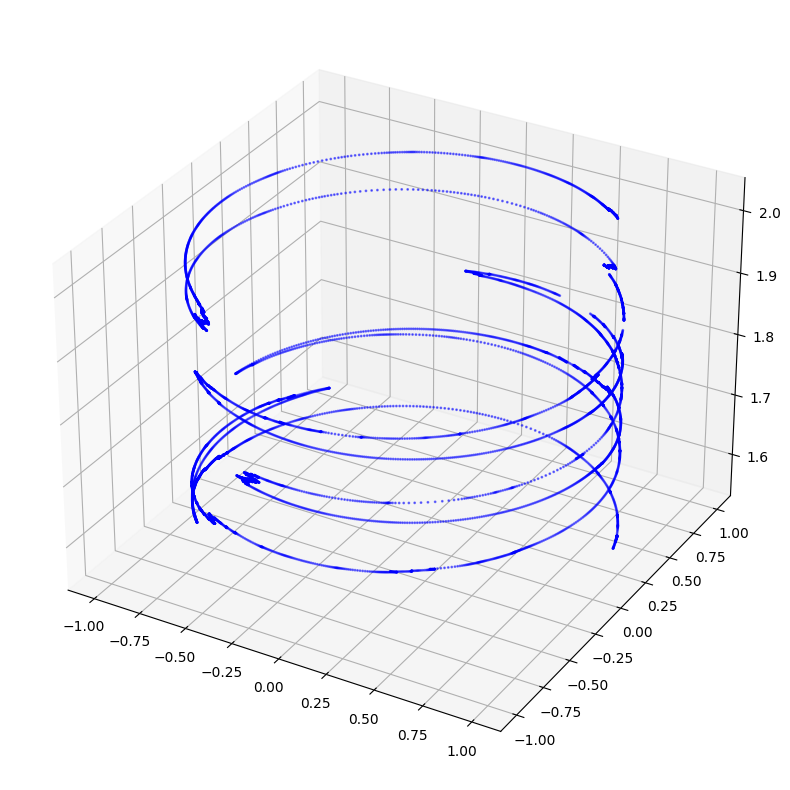

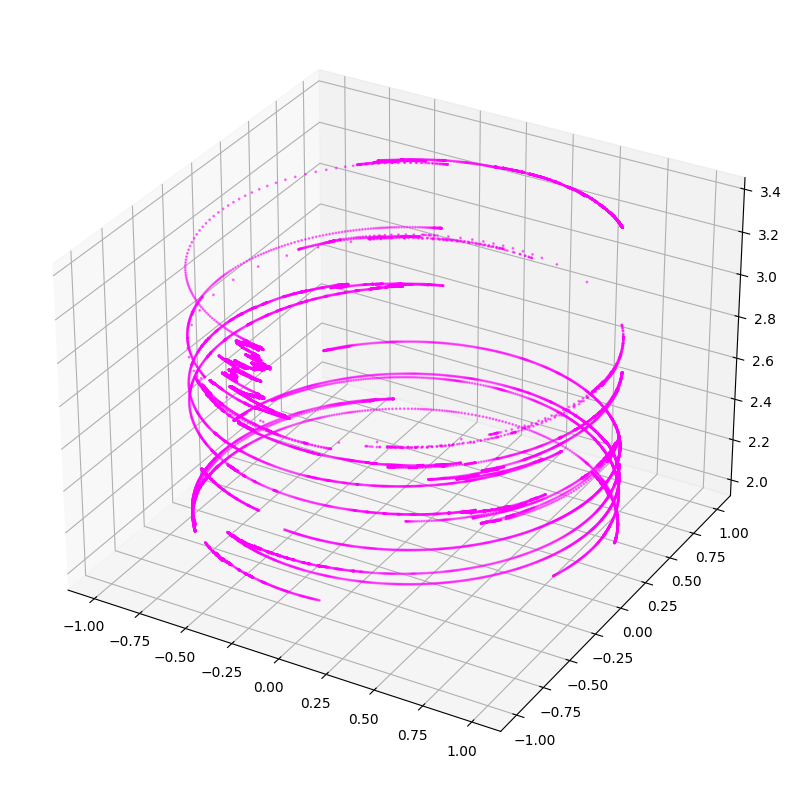

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import math
import random


lapstart=0
lapnum=0
for lapend in laps:
  if lapstart==lapend:
    continue
  thislap=userot.query("lap=="+str(lapnum))

  fig = plt.figure(figsize=(10,10))
  ax = fig.add_subplot(projection='3d')

  #print(userot)
  print( thislap['x_around_z_continuous'].values)
  foo=ax.scatter(thislap['x_around_z_continuous'].values,
                 thislap['y_around_z_continuous'].values,
                 thislap["nanos"].values,
                 color=thislap["lapcolor"].values,
                 s=1,alpha=0.5)

  #ax.scatter(userot['zeros'],userot['zeros'], userot["nanos"], marker='.', color='gray', alpha=0.1)

  lapstart=lapend
  lapnum+=1

plt.show()


                                                              counter  lap lapcolor  minutes
timestamp_index sensortype_index               counter_index                                
382049704829091 android.sensor.rotation_vector 42571            42571    2    green     1.80
382049709817684 android.sensor.rotation_vector 42574            42574    2    green     1.80
382049714806278 android.sensor.rotation_vector 42575            42575    2    green     1.81
382049719794872 android.sensor.rotation_vector 42578            42578    2    green     1.81
382049724783466 android.sensor.rotation_vector 42579            42579    2    green     1.81
382049729772059 android.sensor.rotation_vector 42580            42580    2    green     1.81
382049734760653 android.sensor.rotation_vector 42583            42583    2    green     1.81
382049739749247 android.sensor.rotation_vector 42584            42584    2    green     1.81
382049744737841 android.sensor.rotation_vector 42587            42587 

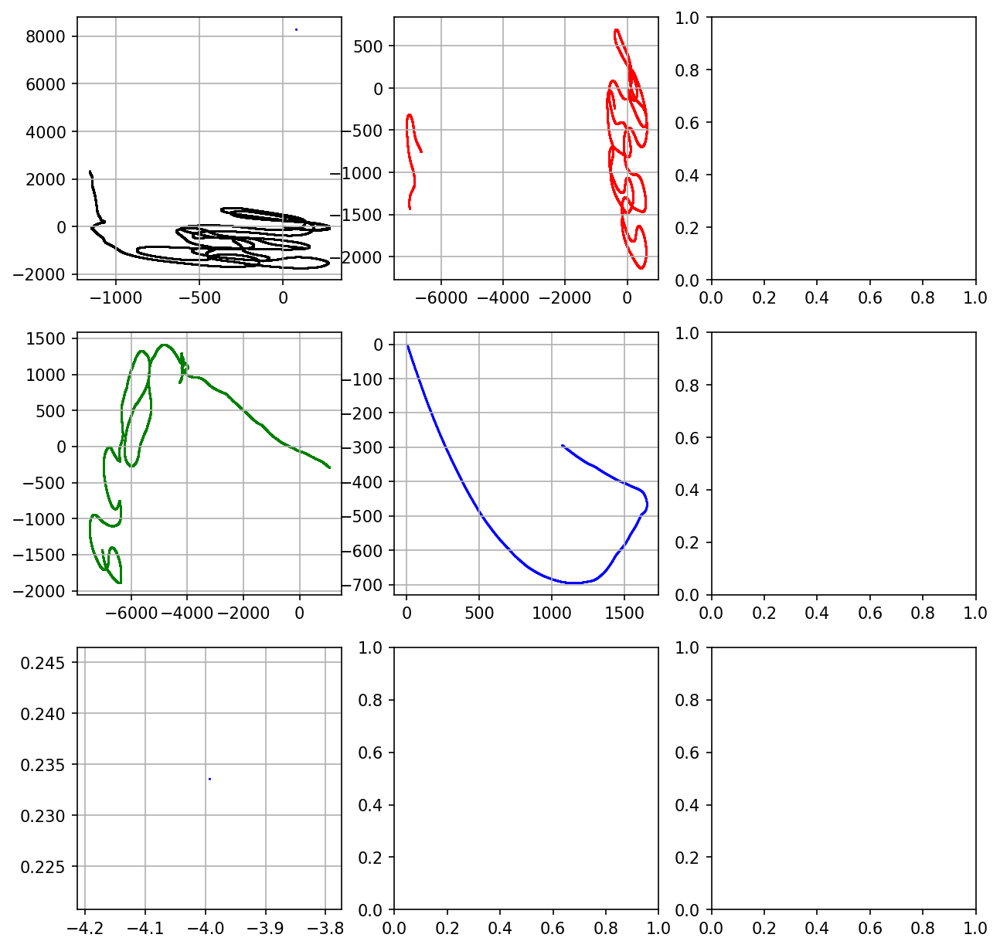

In [ ]:
fig = plt.figure(figsize=(10,10),dpi=150)
#plt.title('Acceleration')
dim = math.ceil(math.sqrt(len(lapn)))

axs = fig.subplots(dim+1,dim+1)

lapstart=0
lapnum=0
picx=0
picy=0
for lapend in laps:
  if lapstart==lapend:
    continue

  ax=axs[int(lapnum/dim), lapnum%dim]
  #ax=axs[picy,picx]
  ax.scatter(userot["x_path"].values[lapnum-1], userot["y_path"].values[lapnum-1],marker='v', label="lap", color='blue', s=0.3)
  xxx=x_path_origin[lapstart:lapend]
  yyy=y_path_origin[lapstart:lapend]
  ax.scatter(yyy,xxx,color=lapcolors[lapnum],s=0.2, alpha=0.5)
  ax.grid()

  if len(xxx)==0:
    continue

  if min(xxx)<-5000:
    print(lapstart, lapend, lapnum, xxx[:10])

  lapstart=lapend
  lapnum+=1
  picx+=1
  if picx>=dim:
    picy+=1
    picx=0




  if lapnum==0:
    plt.title('Acceleration', loc='left')
    fig.legend()

#plt.set_xlabel('seconds')
print(userot.query("counter>42570")[["counter","lap","lapcolor","minutes"]].head(10))
plt.show()

/usr/local/lib/python3.10/dist-packages/matplotlib/cbook/__init__.py:1062: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  x = np.asanyarray(x)


(38.59633990591368, 4.585179343319203, -11.790185343069801)
(63.32657047128357, 19.335150341558975, -14.906655692669581)
(1.5886883083860295, -0.04768930477667325, -1.427691800583785)


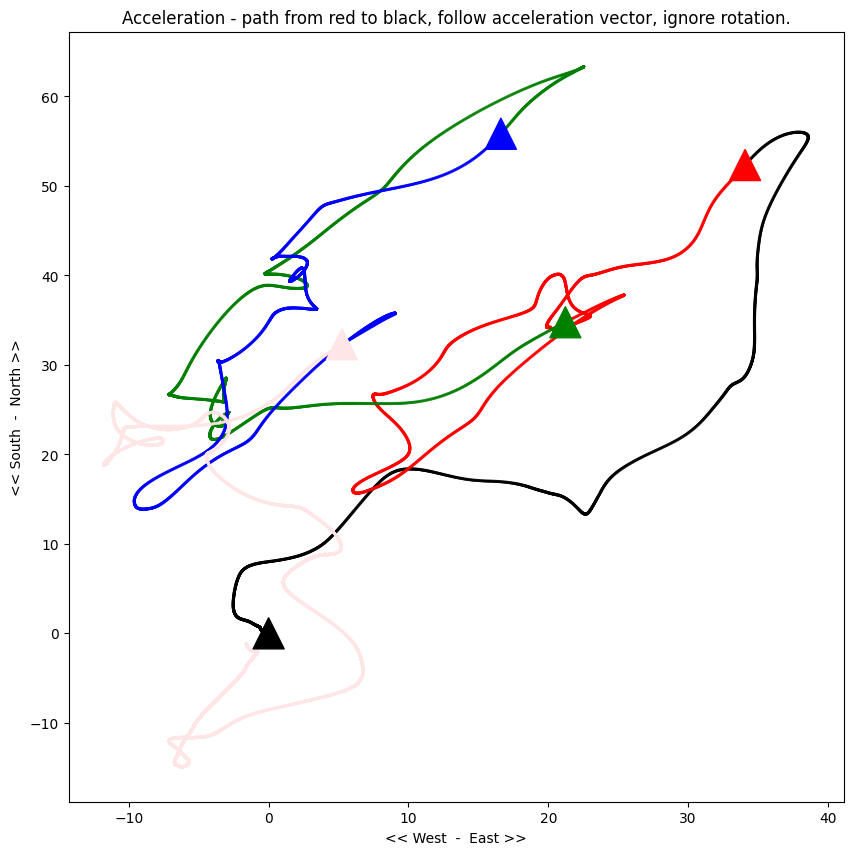

['black', 'red', 'green', 'blue', (1, 0.9, 0.9), 'magenta', 'orange', 'cyan', 'gray', 'black', 'red', 'green', 'blue', (1, 0.9, 0.9), 'magenta', 'orange', 'cyan', 'gray', 'black', 'red', 'green', 'blue', (1, 0.9, 0.9), 'magenta', 'orange', 'cyan', 'gray', 'black', 'red', 'green', 'blue', (1, 0.9, 0.9), 'magenta', 'orange', 'cyan', 'gray', 'black', 'red', 'green', 'blue', (1, 0.9, 0.9), 'magenta', 'orange', 'cyan', 'gray', 'black', 'red', 'green', 'blue', (1, 0.9, 0.9), 'magenta', 'orange', 'cyan', 'gray', 'black', 'red', 'green', 'blue', (1, 0.9, 0.9), 'magenta', 'orange', 'cyan', 'gray', 'black', 'red', 'green', 'blue', (1, 0.9, 0.9), 'magenta', 'orange', 'cyan', 'gray', 'black', 'red', 'green', 'blue', (1, 0.9, 0.9), 'magenta', 'orange', 'cyan', 'gray', 'black', 'red', 'green', 'blue', (1, 0.9, 0.9), 'magenta', 'orange', 'cyan', 'gray']
['black', 'red', 'green', 'blue', (1, 0.9, 0.9), 'magenta', 'orange', 'cyan', 'gray', 'black', 'red', 'green', 'blue', (1, 0.9, 0.9), 'magenta', 'ora

In [ ]:
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot()
#ax.set_zlim(0,200)
#

lapmarkx=[xxs[0]]+[x if m>0 else None for x,y,m in zip(xxs,yys,alldata.query("smoothx>-200000")["lap"].diff().values[:-1])]
lapmarky=[yys[0]]+[y if m>0 else None for x,y,m in zip(xxs,yys,alldata.query("smoothx>-200000")["lap"].diff().values[:-1])]

total_laps=1.0*alldata["lap"].max()
#lapcolors = [(n/total_laps,n/total_laps,n/total_laps) for n in alldata.query("smoothx > -20000")["lap"].values]
#lapcolors = [((n%3)/3.0,(n%3)/3.0,(n%3)/3.0) for n in alldata.query("smoothx > -20000")["lap"].values]
#lapcolors = [(0,(n%2),((n+1)%2)) for n in alldata.query("smoothx > -20000")["lap"].values]
lapcolors=['black','red','green','blue',(1,0.9,0.9),'magenta','orange','cyan','gray']*10
lapc = [lapcolors[n] for n in alldata.query("smoothx > -20000")["lap"].values]
ax.scatter(xxs, yys, marker='*', color=lapc, alpha=0.2, s=2)
#gapcolors=[lapc[a] for a in metrics_gaps_acc]
#ax.scatter([xxs[a] for a in metrics_gaps_acc],[yys[a] for a in metrics_gaps_acc],marker='x', color=gapcolors, alpha=1, s=500)
#ax.scatter([xxs[a] for a in metrics_gaps_acc],[yys[a] for a in metrics_gaps_acc],marker='x', color='black', alpha=1, s=600)
ax.scatter(lapmarkx,lapmarky,marker='^', color=lapc, alpha=1, s=500)

#ax.scatter(xxs, yys, marker='.', color=colors, alpha=1, s=0.2)

ax.set_xlabel('<< West  -  East >>')
ax.set_ylabel('<< South  -  North >>')

print((max(xxs),mean(xxs),min(xxs)))
print((max(yys),mean(yys),min(yys)))
print((max(zzs),mean(zzs),min(zzs)))
plt.title("Acceleration - path from red to black, follow acceleration vector, ignore rotation.")

plt.show()
print(lapcolors[:100])
print(lapcolors[-100:])

print(metrics_gaps_acc)

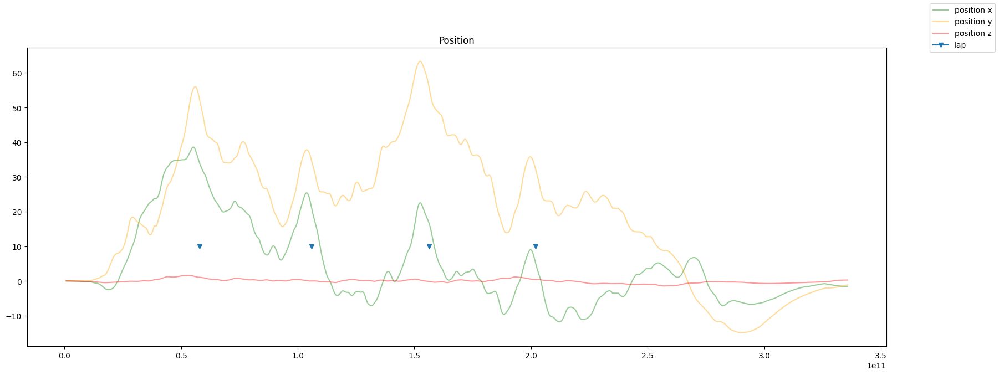

(-11.790185343069801, -14.906655692669581, -1.427691800583785)

In [ ]:
#useacc[["minutes",""]].plot()
fig = plt.figure(figsize=(20,7))
ax = fig.add_subplot()

lapmark=[m if m>0 else None for m in alldata.query("smoothx>-200000")["lap"].diff().values*10]

o=ax.plot(ts,xxs, label="position x", alpha=0.4, color='green')
o=ax.plot(ts,yys, label="position y", alpha=0.4, color='orange')
o=ax.plot(ts,zzs, label="position z", alpha=0.4, color='red')
ax.plot(ts, lapmark,marker='v', label="lap")
ax.set_title("Position")
o=fig.legend()
plt.show()
min(xxs),min(yys),min(zzs)

[-3.0832431611866795, -3.08323458573467, -3.0831548833540197, -3.082992006357292, -3.0827660472685574, -3.0825110354979692, -3.082278612645996, -3.082049781925098, -3.081818692743351, -3.0815160546192355, -3.0810844447625154, -3.080583475797059, -3.080141097539029, -3.079820879293821, -3.079606357018786, -3.0794847136246677, -3.0794612224859064, -3.079522606288662, -3.079676676760254, -3.079935622442699, -3.0802930822994403, -3.08071439953688, -3.0811738361463945, -3.081630220835935, -3.0820580068817445, -3.0824615508254887, -3.0828396333196726, -3.083159780669535, -3.083426019253798, -3.0836522297503555, -3.083815110596016, -3.0839051076007014, -3.083975837050682, -3.0841237555919774, -3.0843896422992465, -3.084751319649021, -3.0851644233625595, -3.085636682383782, -3.0861448539389515, -3.086656128028309, -3.0871126307050267, -3.0874477665049835, -3.0876426404057526, -3.087731685129923, -3.087740954066959, -3.087699858028095, -3.087620953881778, -3.0875159303387454, -3.087401991258097

<ipython-input-30-ba397836f085>:44: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  useacc["afwd"]=[0]*(useacc["smoothx"].size-len(afwd)) + afwd
<ipython-input-30-ba397836f085>:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  useacc["aside"]=[0]*(useacc["smoothx"].size-len(afwd))+aside


-0.07380549399773449 0.07380549376958181
64310 64410
0.005094752065731491
-0.0295287821828951


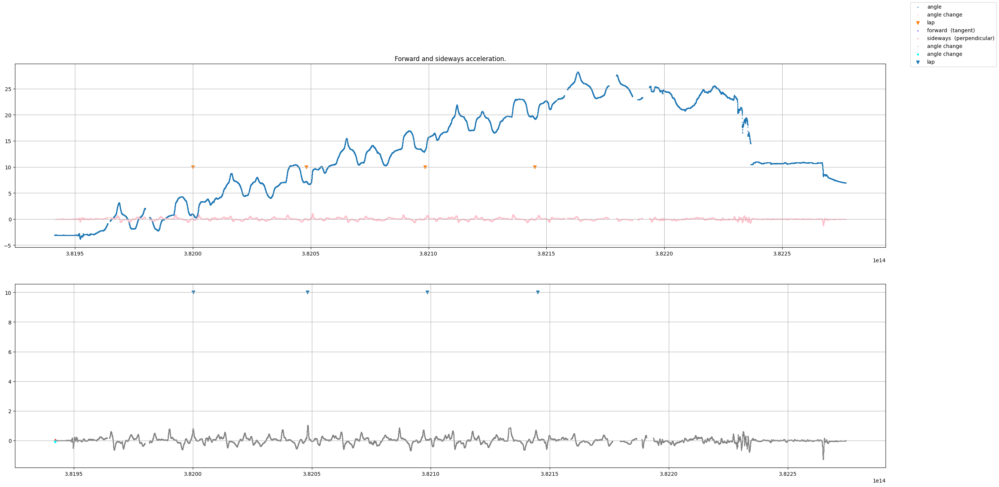

In [ ]:
math.pi

afwd=[]
aside=[]
azs=[]
ats=[]

ts = [row[0] for row in rot]


#accel = list(useacc[["nanos","seconds","minutes","smoothx","smoothy","smoothz"]].to_numpy())
#print(accel)


accel = list(zip(useacc["timestamp"].values,useacc["smoothx"].values,useacc["smoothy"].values,useacc["smoothz"].values))
a = accel.pop(0)
new_ats = a[0]
for direction,t in zip(accangles,ts):
  # scan accelerations until matching ts
  if len(accel)==0:
    break
  while(new_ats<t):
    a = accel.pop(0)
    new_ats = a[0]
  ats.append(new_ats)
  ax = a[1]
  ay = a[2]
  az = a[3]
  direction -=math.pi/2
  afwd.append( ax*math.cos(direction)-ay*math.sin(direction) )
  aside.append( ax*math.sin(direction)+ay*math.cos(direction) )
  azs.append(az)

print(rotzcorr)
print(len(ats),len(afwd))
print(afwd[0:15])
print(ats[0:15])
print(ts[0:15])
print(ts[-1])

atsminutes=[(t-ats[0])/1000.0/1000.0/1000.0/60.0 for t in ats]


useacc["afwd"]=[0]*(useacc["smoothx"].size-len(afwd)) + afwd
alldata["afwd"]=useacc["afwd"]
useacc["aside"]=[0]*(useacc["smoothx"].size-len(afwd))+aside
alldata["aside"]=useacc["aside"]


rts = userot["timestamp"].values

#useaxis3=[z if abs(z) < 2*math.pi else z -(z/abs(z))* math.pi*4 for z in useaxis2]
useaxis3=useaxis2
fig = plt.figure(figsize=(30,14))
ax = fig.add_subplot(2,1,1)
ax.set_title("Forward and sideways acceleration.")


o=ax.scatter(rts[0:len(useaxis3)] ,useaxis3, label="angle", alpha=1, s=1)


anglederiv=[x2-x1 for x1,x2 in zip(useaxis3[:-1],useaxis3[1:])]
sidesum=[x for x in aside]
print(min(sidesum),max(sidesum))
for i in range(2,len(aside)):
  sidesum[i]=sidesum[i-1]+sidesum[i]*(ats[i]-ats[i-1])*N2S
sidesum=[s if abs(s) < 10 else 0 for s in sidesum]

anglederiv=[x*50 if abs( x)<math.pi/32 else 0 for x in anglederiv]
foo = pd.DataFrame({'a':anglederiv})

anglederiv=foo.a.rolling(100,center=False).mean()



ax.scatter(rts[100:len(anglederiv)], anglederiv[100:], label="angle change", alpha=1, s=1, color='pink')
ax.scatter(rts, lapmark[:len(rts)],marker='v', label="lap")

ax.grid()
ax = fig.add_subplot(2,1,2)

print(len(ats[100:len(afwd)+100]),len(afwd))
o=ax.scatter(ats[100:len(afwd)+100],afwd[100:], label="forward  (tangent)", color='blue', alpha=1, s=1)
o=ax.scatter(ats[100:len(afwd)+100],aside[100:], marker='.', label="sideways  (perpendicular)",color='red',  alpha=1, s=1)
#o=ax.scatter(ats[100:len(afwd)+100],azs[100:], marker='.', label="up/down  (z axis)", alpha=01, s=1)
ax.scatter(rts[100:len(anglederiv)-500], anglederiv[600:], marker='.', label="angle change", alpha=1, color='gray', s=1)
ax.scatter(ats[100:len(sidesum)], sidesum[:-100], marker='.', label="angle change", alpha=1, color='cyan')
ax.scatter(rts, lapmark[:len(rts)],marker='v', label="lap")
ax.grid()
print(mean(afwd))
print(mean(aside))

o=fig.legend()
plt.show()


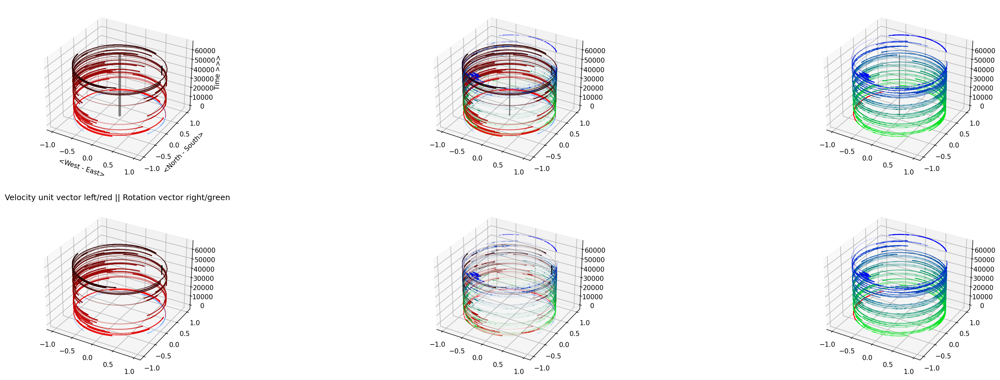

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import math
import random



fig = plt.figure(figsize=(30,10),dpi=150)
ax = fig.add_subplot(2,3,1,projection='3d')
ax4 = fig.add_subplot(2,3,4,projection='3d')

plt.title("Velocity unit vector left/red || Rotation vector right/green")

#Make them equal length...
ratio = len(vxs)/len(rotz)
period = int(math.ceil(1/(1-ratio)))+10000
lvxs = [0.0]*(len(rotz))
lvys = [0.0]*(len(rotz))
lvzs = [0.0]*(len(rotz))
shift=0
for i in range(0, len(vxs)-period):
  if i+shift+1>len(lvxs):
    print("i={}, shift={}, period={}, len(lvxs)={}",i,shift,period, len(lvxs))
    break
  lvxs[i+shift]=vxs[i]
  lvys[i+shift]=vys[i]
  lvzs[i+shift]=vzs[i]
  if i % period == 0 and i>0:
    shift += 1
    lvxs[i+shift]=lvxs[i+shift-1]
    lvys[i+shift]=lvys[i+shift-1]
    lvzs[i+shift]=lvzs[i+shift-1]



accangles=acc2rot_z(lvxs,lvys,lvzs)
xs=[math.cos(2*a) for a in accangles]
ys=[math.sin(2*a) for a in accangles]
zs=[len(xs)-i for i in range(0,len(xs))]

#import numpy as np
#orig_vectors = zip(useacc["smoothx"].values, useacc["smoothy"])
#unit_vectors = [np.linalg.norm(v) for v in orig_vectors]
#dot_product= [np.dot(orig, deriv) for orig, deriv in zip(unit_vectors, zip(xs,ys))]
#angles_diff = [np.arccos(d) for d in dot_product]
#print(unit_vectors[0:100])
#print( [[x,y] for x,y in zip( xs[0:100],ys[0:100])][0:100])
#print(angles_diff[:100])
#print(max(angles_diff), min(angles_diff))


colors=['white']*len(xs)
for i in range(0,len(colors)):
  if i <2000:
      colors[i]=(0.5,0.7,0.99)
  else:
      colors[i]=((len(colors)-i)/len(colors),0,0)
zeros=[0]*len(xs)
consttime=range(0,len(xs))

ax.scatter(xs, ys, consttime, marker='.', color=colors, alpha=0.8, s=0.1)
ax4.scatter([x for x in xs], [x for x in ys], consttime, marker='.', color=colors, alpha=0.8, s=0.1)

ax.scatter(zeros, zeros, zs, marker='.', color='gray', alpha=0.1)
circlex=[math.cos(x) for x in range(0,360)]
circley=[math.sin(y) for y in range(0,360)]
#for i in range(0,len(colors),int(len(colors)/10)):
#  ax.scatter(circlex, circley, consttime[i], marker='.', color='purple', alpha=0.05)

ax.set_xlabel('<West - East>')
ax.set_ylabel('<North - South>')
ax.set_zlabel('Time >>>')


ax2 = fig.add_subplot(2,3,2,projection='3d')
ax3 = fig.add_subplot(2,3,3,projection='3d')
ax5 = fig.add_subplot(2,3,5,projection='3d')
ax6 = fig.add_subplot(2,3,6,projection='3d')

ax2.scatter(xs, ys, consttime, marker='.', color=colors, alpha=0.8, s=0.1)
ax2.scatter(zeros, zeros, zs, marker='.', color='gray', alpha=0.1, s=0.1)
#for i in range(0,len(colors),int(len(colors)/10)):
#  ax2.scatter(circlex, circley, consttime[i], marker='.', color='purple', alpha=0.05)
ax5.scatter([x for x in xs], [x for x in ys], consttime, marker='.', color=colors, alpha=0.1, s=0.1)


useaxis=rotzcorr
xs=[math.cos(a) for a in useaxis]
ys=[math.sin(a) for a in useaxis]
zs=[len(xs)-i for i in range(0,len(xs))]
colors=['white']*len(xs)
for i in range(0,len(colors)):
  if i <4000:
      colors[i]=(0.99,0,0)
  else:
      colors[i]=(0,(len(colors)-i)/len(colors),i/len(colors))
zeros=[0]*len(xs)
consttime=range(0,len(xs))

ax2.scatter(xs, ys, consttime, marker='.', color=colors, alpha=0.1, s=0.1)
ax5.scatter([x for x in xs], [x for x in ys], consttime, marker='.', color=colors, alpha=0.1, s=0.1)


ax3.scatter(xs, ys, consttime, marker='.', color=colors, alpha=0.8, s=0.1)
ax6.scatter([x for x in xs], [x for x in ys], consttime, marker='.', color=colors, alpha=0.8, s=0.1)

ax3.scatter(zeros, zeros, zs, marker='.', color='gray', alpha=0.1, s=0.1)
#for i in range(0,len(colors),int(len(colors)/10)):
#  ax3.scatter(circlex, circley, consttime[i], marker='.', color='purple', alpha=0.05)


plt.show()

In [ ]:
print(mean(afwd),mean(aside))
print(max(afwd),max(aside))

0.005094752065731491 -0.0295287821828951
0.07380549373696722 0.07380549376958181


In [ ]:
x=(21.93803873133961, -111.9124089209382, -236.91450208608984)
y=(156.719172700207, 33.155076391134564, -44.00769551001108)
z=(73.76616890984933, 31.994339039672877, -6.747646582556207)
x2=(x[0]-x[2])*(x[0]-x[2])
y2=(y[0]-y[2])*(y[0]-y[2])
z2=(z[0]-z[2])*(z[0]-z[2])
l=math.sqrt(x2+y2+z2)
l

337.3105216180876

0.07380549373696722
[-0.07379490792156838, -0.07378527149878666, -0.07377615320335486, -0.07376902838681523, -0.07376389917966819, -0.07376119357133082, -0.07376017455637927, -0.07376044961314573, -0.07376322871205801, -0.07376772469526928, -0.07376913507078131, -0.07376320975253901, -0.07375007097541941, -0.07372791441768961, -0.07369209671688873, -0.07364180580972852, -0.07358141649719979, -0.07351822885481551, -0.07345896660598326, -0.07340933687051916, -0.07337396526633547, -0.07335639133661694, -0.07336024159773236, -0.07338565188947066, -0.07342776942817358, -0.07347957761386746, -0.07353544377511934, -0.07359055880365073, -0.07364173355073403, -0.07368778043991893, -0.07372818040958184, -0.07376101513956901, -0.07378469430077206, -0.07379936319537214, -0.07380536180475808, -0.07380207902541325, -0.07378791955365188, -0.07376078557463132, -0.07371840954024927, -0.0736582823087093, -0.07357788994465574, -0.07347589032489137, -0.07335204593189204, -0.07320654041881197, -0.073041325

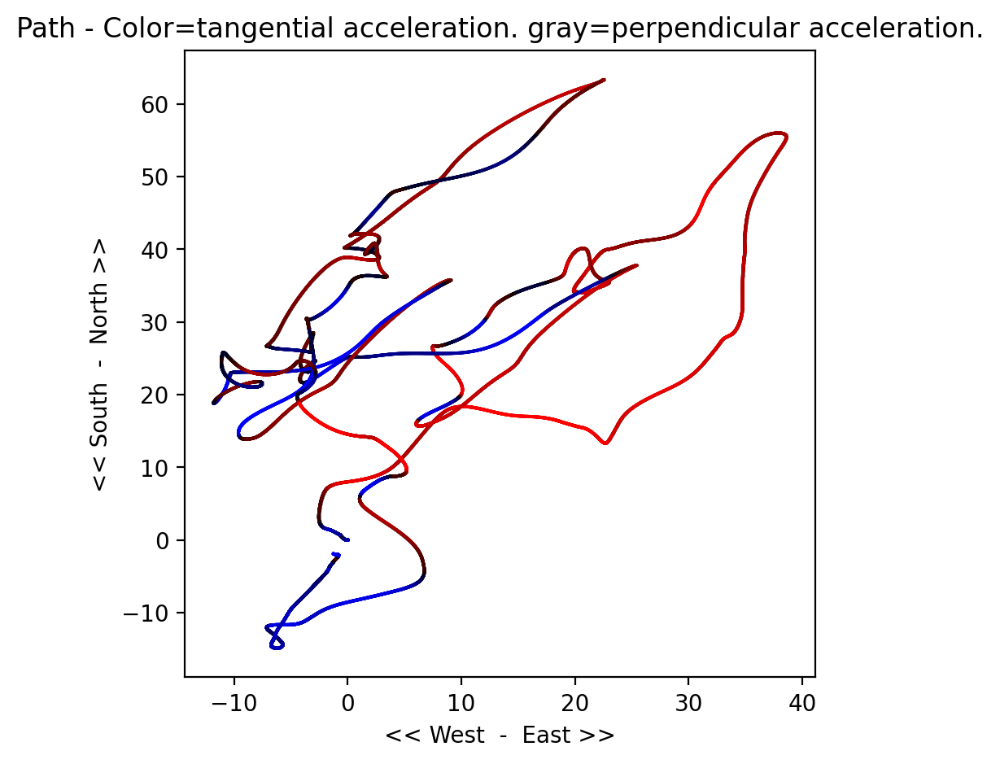

In [ ]:
fig = plt.figure(figsize=(5,5),dpi=200)
ax = fig.add_subplot()
#ax.set_zlim()
print(max(afwd))
fbase=max(max(afwd),abs(min(afwd)))
colors=[(a/fbase*0.9+0.1,0,0) if a>0 else (0,0,-a/fbase*0.9+0.1) for a in afwd]

cl=min(len(xxs),len(aside))
ax.scatter(np.linspace(np.array(xxs[:cl]),np.array(xxs[:cl])-np.array(aside[:cl])), np.linspace(np.array(yys[:cl]),np.array(yys[:cl])-np.array(aside[:cl])),color="gray",alpha=0.01, s=0.01)

ax.scatter(xxs[:len(colors)], yys[:len(colors)], marker='.', color=colors, alpha=0.5,s=0.8)

print(aside)
ax.set_xlabel('<< West  -  East >>')
ax.set_ylabel('<< South  -  North >>')

print((max(xxs),mean(xxs),min(xxs)))
print((max(yys),mean(yys),min(yys)))
print((max(zzs),mean(zzs),min(zzs)))
plt.title("Path - Color=tangential acceleration. gray=perpendicular acceleration.")

plt.show()

[   85  5853 11583 17124 29860 34476 39461 47476 63141]
0.07380549373696722
0.07380549373696722 -0.07380549256193565
[ 1919 16367 21187 40384 50689 63626]
34 160
3524 15633
3524 15633
16668 17660
27849 30922
[-0.07379490792156838, -0.07378527149878666, -0.07377615320335486, -0.07376902838681523, -0.07376389917966819, -0.07376119357133082, -0.07376017455637927, -0.07376044961314573, -0.07376322871205801, -0.07376772469526928, -0.07376913507078131, -0.07376320975253901, -0.07375007097541941, -0.07372791441768961, -0.07369209671688873, -0.07364180580972852, -0.07358141649719979, -0.07351822885481551, -0.07345896660598326, -0.07340933687051916, -0.07337396526633547, -0.07335639133661694, -0.07336024159773236, -0.07338565188947066, -0.07342776942817358, -0.07347957761386746, -0.07353544377511934, -0.07359055880365073, -0.07364173355073403, -0.07368778043991893, -0.07372818040958184, -0.07376101513956901, -0.07378469430077206, -0.07379936319537214, -0.07380536180475808, -0.07380207902541325,

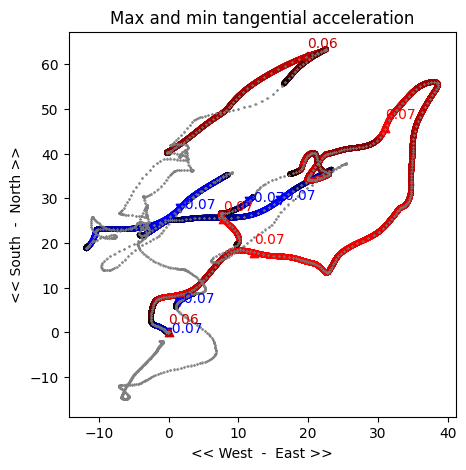

In [ ]:
from scipy.signal import argrelextrema
import numpy as np

df = pd.DataFrame({'afwd':afwd})
# first argument can a multidimentional np array as
# data : ndarray
# Array in which to find the relative extrema.
# This is reflected in what gets returned:
#Returns
#    -------
#    extrema : ndarray
#        Boolean array of the same shape
# That is why at the end of the line we just take the first element
# order: How many points on each side to use for the comparison to consider
ilocs_min = argrelextrema(df.afwd.values, np.less_equal, order=points_in_1s*10)[0]
ilocs_max = argrelextrema(df.afwd.values, np.greater_equal, order=points_in_1s*10)[0]
print(ilocs_max)


fig = plt.figure(figsize=(5,5),dpi=100)
ax = fig.add_subplot()
#ax.set_zlim()
print(max(afwd))
fbase=max(max(afwd),abs(min(afwd)))

ax.scatter(xxs[:-1], yys[:-1], marker='.', color='black', alpha=0.005, s=0.1)


amax=max(afwd)
amin=min(afwd)
print(amax,amin)
print(ilocs_min)

v=[math.sqrt(vx*vx+vy*vy) for vx,vy in zip(vxs,vys)]
vbase=max(max(v),abs(min(v)))
vcolors=[(a/vbase*0.9+0.1,0,0) if a>0 else (0,0,-a/vbase*0.9+0.1) for a in v]


for mi in ilocs_min[:5]:
  mistart=mi
  miend=mi
  while afwd[mistart]<0:
    mistart-=1
  while afwd[miend]<0:
    miend+=1
  if mistart==miend or len(xxs[mistart:miend])==0:
    break

  ax.scatter(xxs[mistart:miend], yys[mistart:miend], marker='.', color=colors[mistart:miend], alpha=1)

for mx in ilocs_max[:5]:
  mxstart=mx
  mxend=mx
  while afwd[mxstart]>0:
    mxstart-=1
  while afwd[mxend]>0:
    mxend+=1
  print(mxstart,mxend)
  mxend=min(mxend,len(xxs))
  ax.scatter(xxs[mxstart:mxend], yys[mxstart:mxend], marker='.', color=colors[mxstart:mxend], alpha=1)


for mi in ilocs_min[:5]:
  ax.scatter(xxs[mi], yys[mi], marker='v', color=(0.0,0.0,abs(afwd[mi])/abs(fbase)), alpha=1.0, label=str(mi))
  ax.annotate(str(round(afwd[mi],2)), xy=(xxs[mi], yys[mi]), xytext=(xxs[mi]+0.05, yys[mi]+0.0),color=(0.0,0.0,abs(afwd[mi])/abs(fbase)),
            arrowprops=dict(facecolor='black', shrink=0.05, alpha=0.0),
            )
for mx in ilocs_max[:5]:
  ax.scatter(xxs[mx], yys[mx], marker='^', color=(abs(afwd[mx])/abs(fbase),0.0,0.0), alpha=1.0, label=str(mx))
  ax.annotate(str(round(afwd[mx],2)), xy=(xxs[mx], yys[mx]), xytext=(xxs[mx]+0, yys[mx]+2),color=(abs(afwd[mx])/abs(fbase),0,0),
            arrowprops=dict(facecolor='black', shrink=0.05, alpha=0.0),
            )
#df.iloc[ilocs_max].price.plot(style='.', lw=10, color='red', marker="v");
#df.iloc[ilocs_min].price.plot(style='.', lw=10, color='green', marker="^");

sidex=[x+math.cos(a+math.pi/2)*math.sqrt(side*side+side2*side2) for a,x,y,side,side2 in zip(accangles,xxs,yys,aside,afwd)]
sidey=[ y+math.sin(a+math.pi/2)*math.sqrt(side*side+side2*side2) for a,x,y,side,side2 in zip(accangles,xxs,yys,aside,afwd)]
sidex=[x+side2 for a,x,y,side,side2 in zip(accangles,xxs,yys,aside,afwd)]
sidey=[ y+side2 for a,x,y,side,side2 in zip(accangles,xxs,yys,aside,afwd)]

for i in range(0,min(len(xxs),len(sidey)),50):
  accelside=np.linspace([xxs[i],yys[i]],[sidex[i],sidey[i]],20)
  ax.scatter([x for x,y in accelside], [y for x,y in accelside], marker='.', color='gray', alpha=0.2,s=0.5)

print(aside)
ax.set_xlabel('<< West  -  East >>')
ax.set_ylabel('<< South  -  North >>')

print((max(xxs),mean(xxs),min(xxs)))
print((max(yys),mean(yys),min(yys)))
print((max(zzs),mean(zzs),min(zzs)))
plt.title("Max and min tangential acceleration")

plt.show()

5
4364 381964.23 0.27938020799999996
7505 381980.96 1.06759974
4364 381964.23 0.27938020799999996
7505 381980.96 1.06759974


/usr/local/lib/python3.10/dist-packages/matplotlib/cbook/__init__.py:1062: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  x = np.asanyarray(x)


vdecay ratio to v and a 0.21791006004687188 0.21877471399425427
vdecay ratio to v and a 0.21851854904464194 0.16952886118822383
1306 382158.12 0.4988489589999999
4969 382178.87 2.4842581249999998
6503 382187.96 1.4466551559999998
7047 382192.85 2.1799547919999998
1306 382158.12 0.4988489589999999
4969 382178.87 2.4842581249999998
6503 382187.96 1.4466551559999998
7047 382192.85 2.1799547919999998
vdecay ratio to v and a 0.4593848160329385 0.538539133137006
vdecay ratio to v and a 3.738898604253207 4.480205873014821


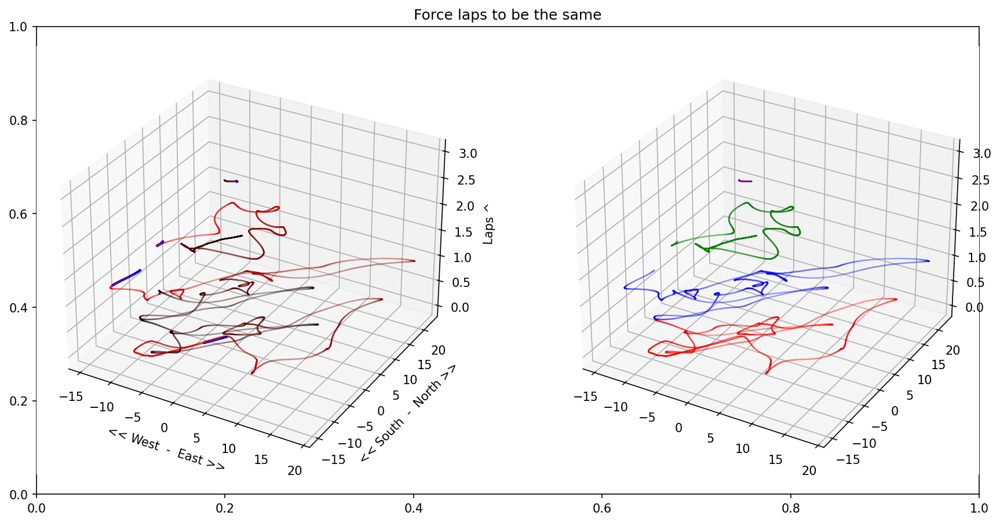

In [ ]:
import time

# Estimate lap markers manually:
#laps=[0,4400,useacc["smoothx"].size]


N2S=1/1000.0/1000.0/1000.0
#N2S=1
reset_every=100000000
vdecay=0.9993
pdecay=0.9993
vmean=1
pmean=1

fig = plt.figure(figsize=(14,7),dpi=150)
plt.title("Force laps to be the same")
ax = fig.add_subplot(1,2,1,projection='3d')
ax2 = fig.add_subplot(1,2,2,projection='3d')

ts=[row for row in useacc["timestamp"]]
xs=[row for row in useacc["smoothx"]]
ys=[row for row in useacc["smoothy"]]
zs=[row for row in useacc["smoothz"]]

minutes=useacc["minutes"]

#addacurve=500
#laps[-1]=laps[-1]+addacurve
#ts=ts[laps[0]:]+[t for t in range(ts[-1],ts[-1]+addacurve*5*1000*1000,5*1000*1000)]
#xs=xs[laps[0]:]+xs[laps[1]-addacurve:laps[1]]
#ys=ys[laps[0]:]+ys[laps[1]-addacurve:laps[1]]
#zs=zs[laps[0]:]+zs[laps[1]-addacurve:laps[1]]
lapstart=laps[0]
lapstart=0
#afwd=afwd[laps[0]:]+afwd[laps[1]-addacurve:laps[1]]
#aside=aside[laps[0]:]+aside[laps[1]-addacurve:laps[1]]
#minutes=minutes[laps[0]:]+minutes[laps[1]-addacurve:laps[1]]
#rotzzz=useaxis3[laps[0]:]+useaxis3[laps[1]-addacurve:laps[1]]

lapsts=[]
lapsxs=[]
lapsys=[]
lapszs=[]
lapsafwd=[]
lapsaside=[]
lapsminutes=[]
lapsrotz=[]
lapsvxs=[]
lapsvys=[]
lapsvzs=[]
lapsxxs=[]
lapsyys=[]
lapszzs=[]

for lapend in laps:
  lapsts.append(ts[lapstart:lapend])
  lapsxs.append(xs[lapstart:lapend])
  lapsys.append(ys[lapstart:lapend])
  lapszs.append(zs[lapstart:lapend])
  lapsafwd.append(afwd[lapstart:lapend])
  lapsaside.append(aside[lapstart:lapend])
  lapsminutes.append(minutes[lapstart:lapend])
  lapsrotz.append(rotzcorr[lapstart:lapend])

  lapstart=lapend

startv=[0,0,0]
startp=[0,0,0]

print(len(lapsts))
for ts,xs,ys,zs,lapnum in zip(lapsts,lapsxs,lapsys,lapszs,range(0,len(laps))):
  if len(xs)==0:
    continue

  #print("-------------------------------------")
  #print("LAP {}",lapnum)
  #print("max-mean-min")
  #print((max(xs),mean(xs),min(xs)))
  #print((max(ys),mean(ys),min(ys)))
  #print((max(zs),mean(zs),min(zs)))



  vxs,vys,vzs = acc2vel(xs,ys,zs,startv)
  xxs,yys,zzs = vel2pos(vxs,vys,vzs,startp)

  startv=[vxs[0],vys[0],vzs[0]]
  startp=[xxs[0],yys[0],zzs[0]]

  minxy=[ min(xxs),min(yys)]
  maxxy=[ max(xxs),max(yys)]

  zeros=[0.0]*len(xxs)
  color=['red', 'blue','green', 'purple','cyan','magenta','orange']
  color=color*10
  colors=['yellow']*len(xxs)
  for i in range(0,len(colors)):
      if i < 100:
        colors[i]='blue'
      else:
        colors[i]=((len(colors)-i)/len(colors),0,0)#1.0*lapnum/len(lapsxs))


  ax.scatter(xxs, yys, lapnum, marker='.', color=colors, alpha=0.1,s=0.1)
  ax.scatter(xxs[0:400], yys[0:400], lapnum, marker='.', color='blue', alpha=1,s=2)
  ax2.scatter(xxs, yys, lapnum, marker='.', color=color[lapnum], alpha=0.1,s=0.1)

  startv=[vxs[-1],vys[-1],vzs[-1]]
  startp=[xxs[-1],yys[-1],zzs[-1]]
  #print(startp)
  #print(startv)
  print("vdecay ratio to v and a",vdecay/mean([math.sqrt(x*x+y*y) for x,y in zip(vxs,vys)]),vdecay/mean([math.sqrt(x*x+y*y) for x,y in zip(xs,ys)]))

  lapsvxs.append(vxs)
  lapsvys.append(vys)
  lapsvzs.append(vzs)

  lapsxxs.append(xxs)
  lapsyys.append(yys)
  lapszzs.append(zzs)


#ax.set_xlim(minxy[0],maxxy[0])
#ax.set_ylim(minxy[1],maxxy[1])
#ax2.set_xlim(minxy[0],maxxy[0])
#ax2.set_ylim(minxy[1],maxxy[1])

ax.set_xlabel('<< West  -  East >>')
ax.set_ylabel('<< South  -  North >>')
ax.set_zlabel('Laps ^')
#ax.set_zlim(0,len(laps))
#ax2.set_zlim(0,len(laps))
plt.show()

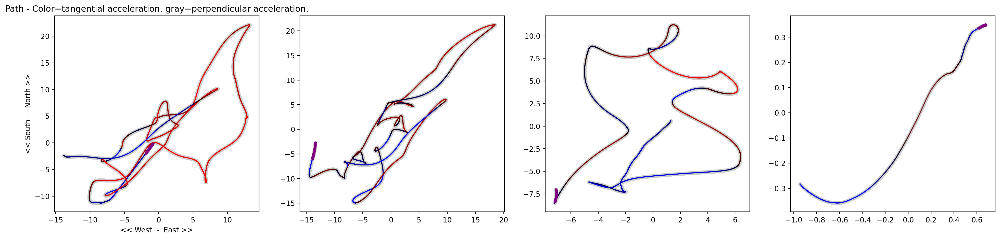

In [ ]:
fig = plt.figure(figsize=(30,5),dpi=200)

for ts,xs,ys,zs,af,lapnum in zip(lapsts,lapsxxs,lapsyys,lapszzs,lapsafwd, range(0,len(laps))):
  if len(xs)==0:
    continue

  ax = fig.add_subplot(1,len(laps),lapnum+1)
  fbase=max(max(afwd),abs(min(afwd)))
  colors_temp=[(a/fbase*0.9+0.1,0,0) if a>0 else (0,0,-a/fbase*0.9+0.1) for a in af]

  colors=[colors_temp[0]]*len(xs)
  for i in range(0,len(xs)):
    j=i*len(af)/len(xs)
    colors[i]=colors_temp[int(j)]

  ax.scatter(xs, ys, marker='o', color=(0.8,0.8,0.8), alpha=1,s=15)
  ax.scatter(xs, ys, marker='.', color=colors[0:len(xs)], alpha=0.5,s=0.8)
  ax.scatter(xs[0:200], ys[0:200], marker='*', color='purple', alpha=1,s=10)

  if lapnum==0:
    plt.title("Path - Color=tangential acceleration. gray=perpendicular acceleration.")
    ax.set_xlabel('<< West  -  East >>')
    ax.set_ylabel('<< South  -  North >>')

plt.show()

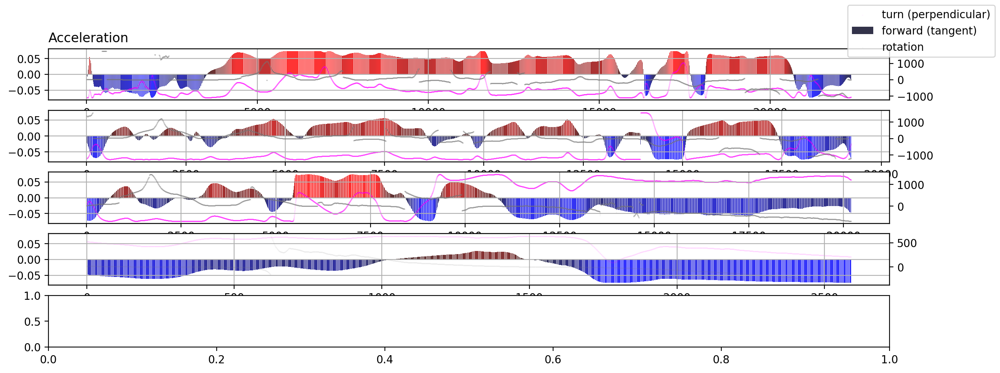

<Axes: title={'center': 'Acceleration (moving average)'}, xlabel='timestamp_index,sensortype_index,counter_index'>

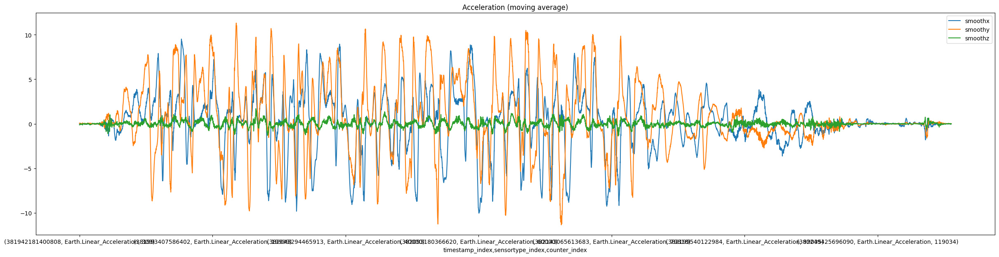

In [ ]:
fig = plt.figure(figsize=(14,5),dpi=200)
#plt.title('Acceleration')
axs = fig.subplots(max(2,len(lapsxs)))



yticks = range(0,len(lapsxs))
for lapnum in yticks:
    r=[(r-lapsrotz[lapnum][0])/math.pi*180 for r in lapsrotz[lapnum]]
    if len(r)==0:
      continue

    ax2 = axs[lapnum].twinx()
    #ax2.scatter(range(0,len(lapsrotz[lapnum])),r, color='purple', alpha=0.3, marker='.', s=0.1, label='rotation')
    #ax2.set_yticks([0,90,180,270,360])

    r=[r-tilt for r,tilt in zip(r,np.linspace(min(r),max(r),len(r)))]
    meanr=mean(r)
    maxr=max(r)
    r=[(r-meanr)*abs(r-meanr)/(90) for r in r]
    ax2.scatter(range(0,len(lapsrotz[lapnum])),r, color='gray', alpha=0.3, marker='.', s=0.01, label='rotation')

    fbase=max(max(lapsafwd[lapnum]),abs(min(lapsafwd[lapnum])))
    #colors=[(a/fbase*0.7+0.3,0,0) if a>0 else (0,0,-a/fbase*0.7+0.3) for a in lapsafwd[lapnum]]


    maxy=max([abs(y) for y in lapsaside[lapnum]])
    y=[y/maxy/2+lapnum for y in lapsaside[lapnum]]
    tmin=min(lapsminutes[lapnum])
    t=[(t-tmin)*60 for t in lapsminutes[lapnum]]

    af=lapsafwd[lapnum]
    colors_temp=[(a/fbase*0.9+0.1,0,0) if a>0 else (0,0,-a/fbase*0.9+0.1) for a in af]

    colors=[colors_temp[0]]*len(af)
    for i in range(0,len(af)):
      j=i*len(colors_temp)/len(af)
      colors[i]=colors_temp[int(j)]

    #axs[lapnum].bar(range(0,len(lapsafwd[lapnum])), lapsafwd[lapnum], color=colors, alpha=0.8, label='forward (tangent)')
    #axs[lapnum].scatter(range(0,len(lapsafwd[lapnum])), lapsafwd[lapnum], color=colors, alpha=0.8, label='forward (tangent)', s=0.6)
    #axs[lapnum].scatter(range(0,len(lapsaside[lapnum])), lapsaside[lapnum], color='magenta', alpha=0.3, marker='.', s=0.01, label='turn (perpendicular)')

    axs[lapnum].bar(range(0,len(lapsafwd[lapnum])), lapsafwd[lapnum], color=colors, alpha=0.8, label='forward (tangent)')
    axs[lapnum].scatter(range(0,len(lapsaside[lapnum])), lapsaside[lapnum], color='magenta', alpha=0.3, marker='.', s=0.01, label='turn (perpendicular)')


    axs[lapnum].grid()
    if lapnum==0:
      plt.title('Acceleration', loc='left')
      fig.legend()

#plt.set_xlabel('seconds')

plt.show()

useacc[["smoothx","smoothy","smoothz"]].plot(figsize=(30,7),title="Acceleration (moving average)")


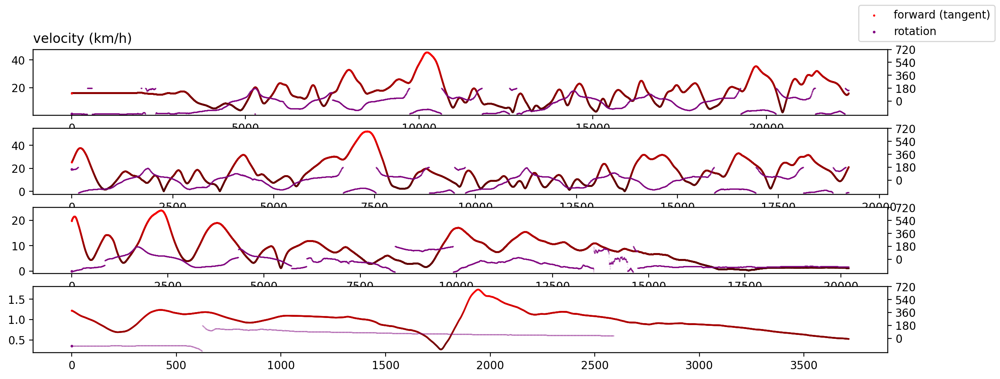

In [ ]:
fig = plt.figure(figsize=(14,5),dpi=200)
axs = fig.subplots(max(2,len(lapsvxs)))



yticks = range(0,len(lapsvxs))
for lapnum in yticks:
    v = [math.sqrt(x*x+y*y)*3.6 for x,y in zip(lapsvxs[lapnum],lapsvys[lapnum])]
    fbase=max(v)
    colors=[(a/fbase*0.7+0.3,0,0) if a>0 else (0,0,-a/fbase*0.7+0.3) for a in v]

    maxy=max([abs(y) for y in v])
    y=[y/maxy/2+lapnum for y in lapsaside[lapnum]]
    tmin=min(lapsminutes[lapnum])
    t=[(t-tmin)*60 for t in lapsminutes[lapnum]]

    axs[lapnum].scatter(range(0,len(v)), v, color=colors, alpha=0.8,s=0.3)
    axs[lapnum].scatter(range(0,1), v[0], color='red', alpha=1, marker='o', label='forward (tangent)',s=1)


    #axs[lapnum].scatter(range(0,len(lapsaside[lapnum])), lapsaside[lapnum], color='gray', alpha=0.8, marker='.', s=0.1)
    #axs[lapnum].scatter(range(0,1), lapsaside[lapnum][0], color='gray', alpha=1, marker='o', s=1, label='turn (perpendicular)')

    #r=[(r-lapsrotz[lapnum][0])/math.pi*180 for r in lapsrotz[lapnum]]
    r=[(r)/math.pi*180 for r in lapsrotz[lapnum]]
    ax2 = axs[lapnum].twinx()
    ax2.scatter(range(0,len(lapsrotz[lapnum])),r, color='purple', alpha=0.3, marker='.', s=0.1)
    ax2.scatter(range(0,1),r[0], color='purple', alpha=1, marker='o', s=2, label='rotation')
    #ax2.set_yticks([0,90,180,270,360,450,540,630,720])
    ax2.set_yticks([0,180,360,540,720])
    axs[lapnum].grid()
    axs[lapnum].grid()
    if lapnum==0:
      plt.title('velocity (km/h)', loc='left')
      fig.legend()

#plt.set_xlabel('seconds')
ax.set_yticks(yticks)


plt.show()

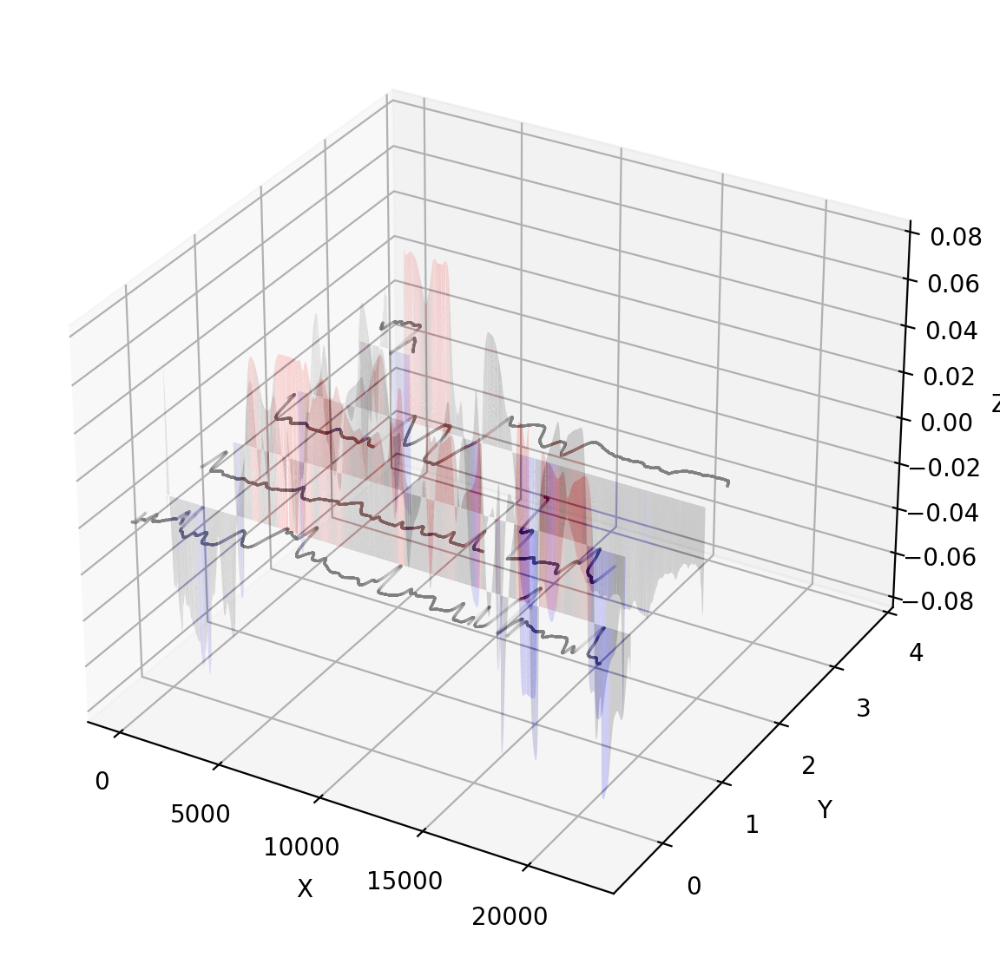

In [ ]:
fig = plt.figure(figsize=(14,7),dpi=200)
ax = fig.add_subplot(projection='3d')

maxx=1
yticks = range(0,len(lapsxs))
for lapnum in yticks:
    if len(lapsafwd[lapnum])==0:
      continue

    fbase=max(max(lapsafwd[lapnum]),abs(min(lapsafwd[lapnum])))
    maxx=max(maxx,len(lapsafwd))
    colors=[(a/fbase*0.7+0.3,0,0) if a>0 else (0,0,-a/fbase*0.7+0.3) for a in lapsafwd[lapnum]]

    z=round(lapnum*max(max([abs(z) for z in lapsaside[lapnum]])*4,1)+1)
    maxy=max([abs(y) for y in lapsaside[lapnum]])
    y=[y/maxy/2+lapnum for y in lapsaside[lapnum]]
    ax.bar(range(0,len(lapsafwd[lapnum])), lapsafwd[lapnum], lapnum, zdir='y', color=colors, alpha=0.1)
    ax.scatter(range(0,len(lapsaside[lapnum])), y, 0, color='gray', alpha=0.3, marker='.',s=0.01)

ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')

# On the y-axis let's only label the discrete values that we have data for.
ax.set_yticks(yticks)
#ax.set_zlim(0.01,abs(fbase)*2)
#ax.set_ylim(-len(yticks)/2,len(yticks))
#ax.set_xlim(-maxx,maxx)
plt.show()

65534
[0.768309167, 0.773298177, 0.778287188, 0.783276198, 0.7882652090000001]
[335.51918234899995, 335.524170943, 335.529159536, 335.53414813, 335.539136724, 335.54412531800006, 335.549113911, 335.554102505, 335.55909109899994, 335.564079693, 335.569068286, 335.57405688, 335.579045474, 335.58403406800005, 335.589022661, 335.594011255, 335.59899984899994, 335.603988443, 335.608977036, 335.61396563]
5
[22367, 41612, 61819, 79919, 130100]
0.07380549373696722
[-0.07379490792156838, -0.07378527149878666, -0.07377615320335486, -0.07376902838681523, -0.07376389917966819, -0.07376119357133082, -0.07376017455637927, -0.07376044961314573, -0.07376322871205801, -0.07376772469526928, -0.07376913507078131, -0.07376320975253901, -0.07375007097541941, -0.07372791441768961, -0.07369209671688873, -0.07364180580972852, -0.07358141649719979, -0.07351822885481551, -0.07345896660598326, -0.07340933687051916, -0.07337396526633547, -0.07335639133661694, -0.07336024159773236, -0.07338565188947066, -0.0734277

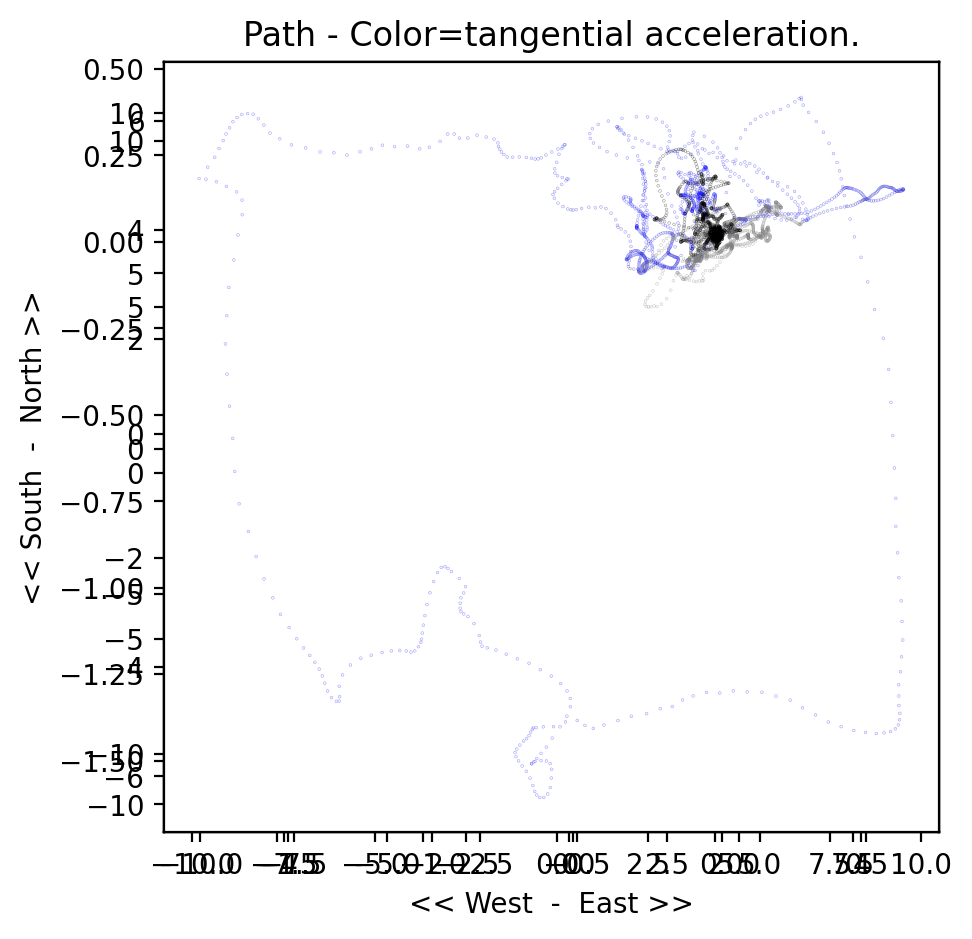

In [ ]:
# Estimate lap markers manually:
#laps=[0,3500,7500]
#lapts=[0,79.036739, 126.944692,161.927146,233.873047,300.755339,300.755339,426.923185,463.931256,601.441516]
#lapts=[0.348006,54.717941,204.268487 ]
#laps = [20926,42574,61819,80881]
#lapts = [0.9, 1.8, 2.6, 3.4]

sec = list(useacc["seconds"].values)
print(len(sec))
print(sec[:5])
print(sec[-20:])
print(len(laps))


print(laps)
#print(laps[0])
#print(alldata.query("sensortype=='RaceEvent'"))
#print(alldata.query("zz9=='henrik i.'"))
#print(alldata.query("zz9=='henrik i.'")[["zz3","zz4","zz5","zz6","zz7","zz8"]])

print(max(afwd))
fbase=max(max(afwd),abs(min(afwd)))
fig = plt.figure(figsize=(5,5),dpi=200)
yticks = range(0,len(lapsxs))
for lapnum in yticks:
    if len(lapsafwd[lapnum])==0:
      continue

    a = lapsafwd[lapnum]
    x = lapsxs[lapnum]
    y = lapsys[lapnum]

    ax = fig.add_subplot()
    #ax.set_zlim()

    colors=[(aaaa/fbase*0.5+0.5,0.1,0.1) if aaaa>fbase/2 else (0.1,0.1,-aaaa/fbase*0.5+0.5) if aaaa < -fbase/2 else (0.5,0.5,0.5) for aaaa in a]
    colors=colors + [(0,0,0)]*(len(x)-len(colors))

    ax.scatter(x, y, marker='.', color=colors, alpha=0.5, s=0.1)

"""
sidex=[x+math.cos(a+math.pi/2)*math.sqrt(side*side+side2*side2) for a,x,y,side,side2 in zip(accangles,xxs,yys,aside,afwd)]
sidey=[ y+math.sin(a+math.pi/2)*math.sqrt(side*side+side2*side2) for a,x,y,side,side2 in zip(accangles,xxs,yys,aside,afwd)]
sidex=[x+side2 for a,x,y,side,side2 in zip(accangles,xxs,yys,aside,afwd)]
sidey=[ y+side2 for a,x,y,side,side2 in zip(accangles,xxs,yys,aside,afwd)]
for i in range(0,len(xxs),50):
  accelside=np.linspace([xxs[i],yys[i]],[sidex[i],sidey[i]],20)
  ax.scatter([x for x,y in accelside], [y for x,y in accelside], marker='.', color='gray', alpha=0.2)
"""
print(aside)
ax.set_xlabel('<< West  -  East >>')
ax.set_ylabel('<< South  -  North >>')

plt.title("Path - Color=tangential acceleration.")
#for i in range(0,len(laps)-2):
#  ax.scatter(xxs[laps[i]],yys[laps[i]], marker='.', color='purple')

plt.show()

In [ ]:
print(useacc.head(230))

                                                                x         y         z   zz  quality  zz2  zz3  zz4  zz5  zz6  ...        vx        vy        vz            px            py  \
timestamp_index sensortype_index          counter_index                                                                       ...                                                             
381942181400808 Earth.Linear_Acceleration 309           -0.226154 -0.323110  0.370328  0.0      NaN  NaN  NaN  NaN  NaN  NaN  ...  0.000000  0.000000  0.000000  0.000000e+00  0.000000e+00   
381942186389818 Earth.Linear_Acceleration 310           -0.168790 -0.358348  0.382434  0.0      NaN  NaN  NaN  NaN  NaN  NaN  ... -0.000048  0.000172 -0.000307 -1.195900e-07  4.289953e-07   
381942191378829 Earth.Linear_Acceleration 313           -0.081272 -0.357445  0.363426  0.0      NaN  NaN  NaN  NaN  NaN  NaN  ... -0.000096  0.000337 -0.000607 -3.598989e-07  1.269949e-06   
381942196367839 Earth.Linear_Acceleration 314

In [ ]:
window_size

155

In [ ]:
alldata["seconds"].diff()


timestamp_index  sensortype_index                counter_index
381941413091641  Earth.Linear_Acceleration       0                     NaN
381941418080652  Earth.Linear_Acceleration       1                0.004989
381941413091641  android.sensor.rotation_vector  2               -0.004989
381941418080652  android.sensor.rotation_vector  3                0.004989
381941423069662  Earth.Linear_Acceleration       4                0.004989
                                                                    ...   
382277017080084  Earth.Linear_Acceleration       130096           0.009977
382277022068677  Earth.Linear_Acceleration       130097           0.004989
382277027057271  Earth.Linear_Acceleration       130098           0.004989
382277012091490  android.sensor.rotation_vector  130099          -0.014966
382277017080084  android.sensor.rotation_vector  130100           0.004989
Name: seconds, Length: 130101, dtype: float64

In [ ]:
alldata["seconds"].diff()


timestamp_index  sensortype_index                counter_index
381941413091641  Earth.Linear_Acceleration       0                     NaN
381941418080652  Earth.Linear_Acceleration       1                0.004989
381941413091641  android.sensor.rotation_vector  2               -0.004989
381941418080652  android.sensor.rotation_vector  3                0.004989
381941423069662  Earth.Linear_Acceleration       4                0.004989
                                                                    ...   
382277017080084  Earth.Linear_Acceleration       130096           0.009977
382277022068677  Earth.Linear_Acceleration       130097           0.004989
382277027057271  Earth.Linear_Acceleration       130098           0.004989
382277012091490  android.sensor.rotation_vector  130099          -0.014966
382277017080084  android.sensor.rotation_vector  130100           0.004989
Name: seconds, Length: 130101, dtype: float64

In [ ]:
alldata["timedelta"] = alldata["seconds"].diff()


<Axes: xlabel='timestamp_index,sensortype_index,counter_index'>

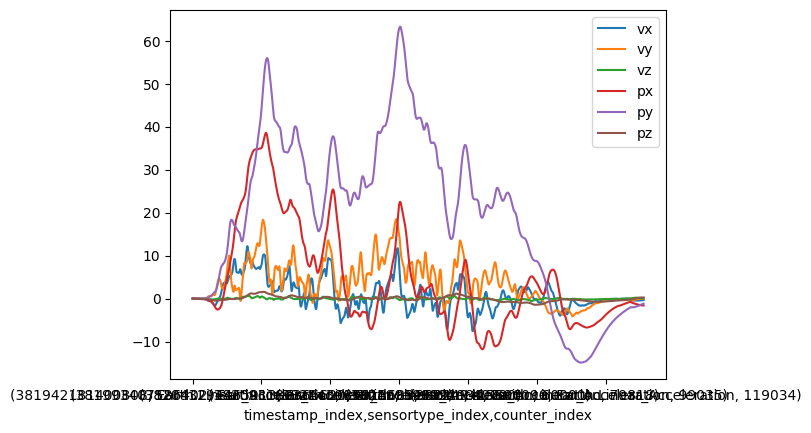

In [ ]:
useacc[["vx","vy","vz","px","py","pz"]].plot()

In [ ]:
useacc[["timedelta","timestamp"]].plot(secondary_y=["timedelta"])

KeyError: ignored

In [ ]:
useacc

,,,tsdiff
timestamp_index,sensortype_index,counter_index,
381941413091641,android.sensor.rotation_vector,2,-4989011.0
381941423069662,android.sensor.rotation_vector,24,-94791198.0
381941522849871,android.sensor.rotation_vector,60,-74835156.0
381941602674037,android.sensor.rotation_vector,79,-9978021.0
381941612652058,android.sensor.rotation_vector,82,-4989010.0
...,...,...,...
382276962205552,android.sensor.rotation_vector,130077,-4988594.0
382276972182740,android.sensor.rotation_vector,130082,-9977187.0
382276982159927,android.sensor.rotation_vector,130088,-19954375.0


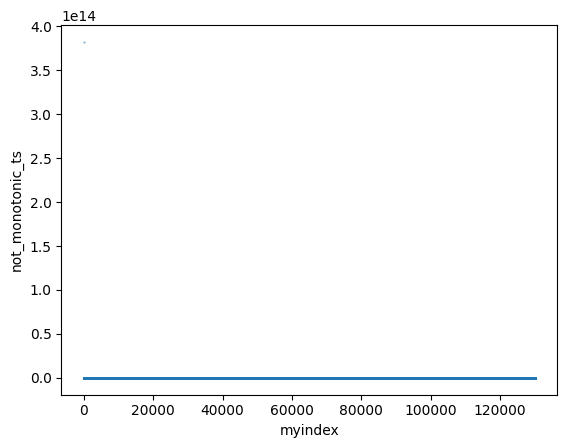

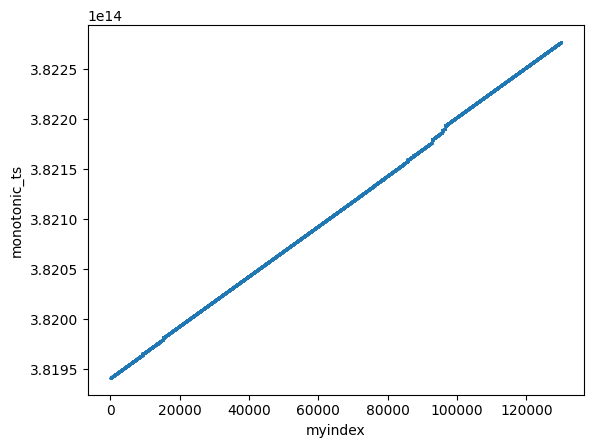

In [ ]:
import itertools

def check_monotonic(accumulated, new_v):
  if accumulated is None or accumulated < new_v:
    return new_v
  return None

def check_monotonic_inverse(accumulated, new_v):
  if accumulated > new_v:
    return new_v
  return 0

alldata["myindex"]=range(0,alldata["timestamp"].size)
colors=[(1,0,0) if tsdiff>0 else (0,0,1) for tsdiff in alldata["timestamp"].values]
alldata["monotonic_ts"]=list(itertools.accumulate(alldata["timestamp"].values,check_monotonic))
alldata["not_monotonic_ts"]=list(itertools.accumulate(alldata["timestamp"].values,check_monotonic_inverse))

alldata["tempcolor"]=colors
alldata[["timestamp","monotonic_ts","not_monotonic_ts","myindex","tempcolor"]].plot(kind="scatter", x="myindex", y="not_monotonic_ts", s=0.1)
alldata[["timestamp","monotonic_ts","not_monotonic_ts","myindex","tempcolor"]].plot(kind="scatter", x="myindex", y="monotonic_ts", s=0.1)
pd.DataFrame({"tsdiff":alldata["timestamp"].diff()}).query("tsdiff>1000000000")
pd.DataFrame({"tsdiff":alldata["timestamp"].diff()}).query("tsdiff<0")

In [ ]:
def test(a,b):
  print(a,b)
  return a+b

import itertools
list(itertools.accumulate(list(range(0,10)),test))

0 1
1 2
3 3
6 4
10 5
15 6
21 7
28 8
36 9


[0, 1, 3, 6, 10, 15, 21, 28, 36, 45]

In [ ]:
alldata.index.values

array([(381941413091641, 'Earth.Linear_Acceleration', 0),
       (381941418080652, 'Earth.Linear_Acceleration', 1),
       (381941413091641, 'android.sensor.rotation_vector', 2), ...,
       (382277027057271, 'Earth.Linear_Acceleration', 130098),
       (382277012091490, 'android.sensor.rotation_vector', 130099),
       (382277017080084, 'android.sensor.rotation_vector', 130100)],
      dtype=object)

In [ ]:
print(alldata.index.values)
print(np.transpose(alldata.index.values))


[(381941413091641, 'Earth.Linear_Acceleration', 0)
 (381941418080652, 'Earth.Linear_Acceleration', 1)
 (381941413091641, 'android.sensor.rotation_vector', 2) ...
 (382277027057271, 'Earth.Linear_Acceleration', 130098)
 (382277012091490, 'android.sensor.rotation_vector', 130099)
 (382277017080084, 'android.sensor.rotation_vector', 130100)]
[(381941413091641, 'Earth.Linear_Acceleration', 0)
 (381941418080652, 'Earth.Linear_Acceleration', 1)
 (381941413091641, 'android.sensor.rotation_vector', 2) ...
 (382277027057271, 'Earth.Linear_Acceleration', 130098)
 (382277012091490, 'android.sensor.rotation_vector', 130099)
 (382277017080084, 'android.sensor.rotation_vector', 130100)]


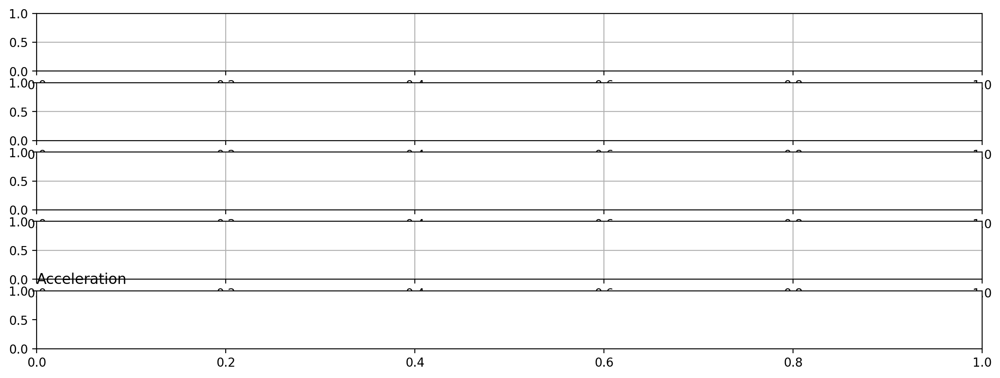

In [ ]:
fig = plt.figure(figsize=(14,5),dpi=200)
#plt.title('Acceleration')
axs = fig.subplots(max(2,len(lapsxs)))



yticks = range(0,len(lapsxs))
for lapnum in yticks:
    r=[(r-lapsrotz[lapnum][0])/math.pi*180 for r in lapsrotz[lapnum]]
    if len(r)==0:
      continue

    ax.scatter(range(0,len(lapsrotz[lapnum])),r, color='purple', alpha=0.3, marker='.', s=0.1, label='rotation')
    ax.set_yticks([0,90,180,270,360])

    r=[r-tilt for r,tilt in zip(r,np.linspace(min(r),max(r),len(r)))]
    meanr=mean(r)
    maxr=max(r)
    r=[(r-meanr)*abs(r-meanr)/(90) for r in r]
    ax.scatter(range(0,len(lapsrotz[lapnum])),r, color='gray', alpha=0.3, marker='.', s=0.01, label='tilted')

    fbase=max(max(lapsafwd[lapnum]),abs(min(lapsafwd[lapnum])))
    colors=[(a/fbase*0.7+0.3,0,0) if a>0 else (0,0,-a/fbase*0.7+0.3) for a in lapsafwd[lapnum]]


    maxy=max([abs(y) for y in lapsaside[lapnum]])
    y=[y/maxy/2+lapnum for y in lapsaside[lapnum]]
    tmin=min(lapsminutes[lapnum])
    t=[(t-tmin)*60 for t in lapsminutes[lapnum]]


    axs[lapnum].grid()
    if lapnum==0:
      plt.title('Acceleration', loc='left')
      #fig.legend()

#plt.set_xlabel('seconds')

plt.show()

In [ ]:
import pandas as pd
from google.colab import drive
import numpy as np




ROWS=0
COLS=1
#drive.mount('/content/drive')
fullpath = '/content/drive/MyDrive/' + folder +"/derived/"+ filename + "snap1.csv"
compression_opts = dict(method='zip', archive_name=fullpath)
alldata.to_csv(fullpath, index=True, compression=compression_opts)


